# Office Building Energy Prediction Demonstration - GBM

This notebook is a demonstration of the use of the Building Data Genome Project Data to illustrate how a prediction competition using whole building electrical meter data could be set up. 

The open data set we're using for this demonstration is the Building Data Genome Project (https://github.com/buds-lab/the-building-data-genome-project)

First we'll load the *meta* data and take a look around - these data show the diversity of building types in this machine learning exercise

In [1]:
import pandas as pd
import os
import numpy as np
from scipy import optimize
from sklearn.metrics import r2_score
from sklearn import ensemble
from sklearn.model_selection import RandomizedSearchCV
import matplotlib.pyplot as plt

In [2]:
meta = pd.read_csv(r"D:\Temp\20190301\building-data-genome-project-v1\meta_open.csv", index_col='uid', parse_dates=["datastart","dataend"], dayfirst=True)
meta.head()

,dataend,datastart,energystarscore,heatingtype,industry,mainheatingtype,numberoffloors,occupants,primaryspaceusage,rating,sqft,sqm,subindustry,timezone,yearbuilt,nickname,primaryspaceuse_abbrev,newweatherfilename,annualschedule
uid,,,,,,,,,,,,,,,,,,,
Office_Abbey,2015-12-31 23:00:00,2015-01-01,NaN,NaN,Education,NaN,NaN,NaN,Office,NaN,74180.0,6891.544540,College/University,America/Phoenix,1930,Abbey,Office,weather0.csv,schedule2.csv
Office_Abigail,2015-12-31 23:00:00,2015-01-01,NaN,NaN,Education,NaN,NaN,NaN,Office,NaN,9703.0,901.437809,College/University,America/Phoenix,1940,Abigail,Office,weather0.csv,schedule2.csv
Office_Al,2015-12-31 23:00:00,2015-01-01,NaN,NaN,Education,NaN,NaN,NaN,Office,NaN,118966.0,11052.298300,College/University,America/Phoenix,1988,Al,Office,weather0.csv,schedule2.csv
Office_Alannah,2015-12-31 23:00:00,2015-01-01,NaN,NaN,Education,NaN,NaN,NaN,Office,NaN,10135.0,941.571905,College/University,America/Phoenix,NaN,Alannah,Office,weather0.csv,schedule2.csv
Office_Aliyah,2015-12-31 23:00:00,2015-01-01,NaN,NaN,Education,NaN,NaN,NaN,Office,NaN,202435.0,18806.818810,College/University,America/Phoenix,1967,Aliyah,Office,weather0.csv,schedule2.csv


In [4]:
temporal = pd.read_csv(r"D:\Temp\20190301\building-data-genome-project-v1\temp_open_utc_complete.csv", index_col='timestamp', parse_dates=True).tz_convert('utc')
temporal.head()

,Office_Cristina,PrimClass_Jolie,PrimClass_Jaylin,Office_Jesus,PrimClass_Uma,UnivClass_Tamra,PrimClass_Jayla,PrimClass_Janiya,PrimClass_Umar,PrimClass_Janice,...,Office_Emer,Office_Elena,Office_Emerald,Office_Ellis,Office_Elliot,Office_Eddie,Office_Georgia,UnivDorm_Lysander,PrimClass_Jazmin,PrimClass_Jenna
timestamp,,,,,,,,,,,,,,,,,,,,,
2010-01-01 08:00:00+00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2010-01-01 09:00:00+00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2010-01-01 10:00:00+00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2010-01-01 11:00:00+00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2010-01-01 12:00:00+00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [5]:
singlebuilding = "Office_Bobbi"

# Get Data
single_timezone = meta.T[singlebuilding].timezone
single_start = meta.T[singlebuilding].datastart
single_end = meta.T[singlebuilding].dataend
single_building_data = pd.DataFrame(temporal[singlebuilding].tz_convert(single_timezone).truncate(before=single_start,after=single_end))

single_building_data["elec_lastDay"] = single_building_data[singlebuilding].shift(24)
single_building_data["elec_lastWeek"] = single_building_data[singlebuilding].shift(24*7)                

# Get weather file
weatherfilename = meta.T[singlebuilding].newweatherfilename
print("Weatherfile: "+weatherfilename)
weather = pd.read_csv(os.path.join("D:/Temp/20190301/building-data-genome-project-v1/",weatherfilename),index_col='timestamp', parse_dates=True, na_values='-9999')
weather = weather.tz_localize(single_timezone, ambiguous = 'infer')
outdoor_temp = pd.DataFrame(weather[[col for col in weather.columns if 'Temperature' in col]]).resample("H").mean()
outdoor_temp = outdoor_temp.reindex(pd.DatetimeIndex(start=outdoor_temp.index[0], periods=len(single_building_data), freq="H")).fillna(method='ffill').fillna(method='bfill')

# Split into Training and Testing
single_building_data = pd.concat([single_building_data, outdoor_temp], axis=1, join='inner')
single_building_data.dropna(inplace=True)          

trainingdata = single_building_data[single_building_data.index.month.isin(["1","2","3","5","6","7","9","10","11"])]

# Create training data array

def objective(alphaValue):
    train_labels = np.array(trainingdata[singlebuilding].values)
    train_features = np.array(pd.concat([pd.Series(trainingdata.index.hour),
                                         pd.Series(trainingdata.index.dayofweek),
                                         pd.Series(trainingdata['TemperatureC'].values)], axis=1))    
    train_features[:,-1] = pd.DataFrame(train_features[:,-1]).ewm(alpha=alphaValue).mean().values.T   

    # Instantiate model with GBM
    best_params={'subsample': 0.5,
                 'n_estimators': 400,
                 'min_samples_split': 14,
                 'min_samples_leaf': 100,
                 'max_features': 'sqrt',
                 'max_depth': 20,
                 'learning_rate': 0.01}
    rf = ensemble.GradientBoostingRegressor(**best_params)
    # Train the model on training data
    rf.fit(train_features, train_labels)

    # Use the forest's predict method on the train data
    predictions = rf.predict(train_features)
    # Calculate the absolute errors
    errors = abs(predictions - train_labels)
    # Print out the mean absolute error (mae)
    errors_mean = round(np.mean(errors), 2)

    return errors_mean               

result = optimize.minimize_scalar(objective, bounds=(0.01,0.99), method='bounded', options={'xatol': 1e-03, 'maxiter': 500})
alphaValue = result.x
print('alpha: '+str(round(alphaValue,3)))

# Split into Training and Testing
outdoor_temp['TemperatureC_ewm'] = outdoor_temp['TemperatureC'].copy().ewm(alpha=alphaValue).mean()
single_building_data = pd.DataFrame(temporal[singlebuilding].tz_convert(single_timezone).truncate(before=single_start,after=single_end))
single_building_data["elec_lastDay"] = single_building_data[singlebuilding].shift(24)
single_building_data["elec_lastWeek"] = single_building_data[singlebuilding].shift(24*7) 
single_building_data = pd.concat([single_building_data, outdoor_temp], axis=1, join='inner')
single_building_data.dropna(inplace=True)                  

trainingdata = single_building_data[single_building_data.index.month.isin(["1","2","3","5","6","7","9","10","11"])]
testdata = single_building_data[single_building_data.index.month.isin(["4","8","12"])]

train_labels = np.array(trainingdata[singlebuilding].values)
train_features = np.array(pd.concat([pd.Series(trainingdata.index.hour),
                                     pd.Series(trainingdata.index.dayofweek),
                                     pd.Series(trainingdata['elec_lastDay'].values),
                                     pd.Series(trainingdata['elec_lastWeek'].values),
                                     pd.Series(trainingdata['TemperatureC'].values),
                                     pd.Series(trainingdata['TemperatureC_ewm'].values)], axis=1))                 



Weatherfile: weather7.csv


C:\Users\patri\Anaconda3\lib\site-packages\ipykernel_launcher.py:18: FutureWarning: Creating a DatetimeIndex by passing range endpoints is deprecated.  Use `pandas.date_range` instead.


alpha: 0.709


In [7]:
param_grid1 = {'max_depth': np.arange(10, 110, 10),
                'n_estimators': np.arange(100, 1000, 100),
                'min_samples_split': np.arange(2, 22, 2),
                'min_samples_leaf': np.arange(50, 550, 50),
                'learning_rate': [0.01],
                'subsample': [0.5],
                'max_features': ['auto','sqrt']}

grid1 = RandomizedSearchCV(estimator = ensemble.GradientBoostingRegressor(),
                            n_iter = 1000, param_distributions = param_grid1, 
                            cv = 5, verbose = 10, n_jobs = 7)

grid1.fit(train_features, train_labels)

Fitting 5 folds for each of 1000 candidates, totalling 5000 fits


[Parallel(n_jobs=7)]: Using backend LokyBackend with 7 concurrent workers.
[Parallel(n_jobs=7)]: Done   4 tasks      | elapsed:    3.0s
[Parallel(n_jobs=7)]: Done  11 tasks      | elapsed:    4.2s
[Parallel(n_jobs=7)]: Done  18 tasks      | elapsed:    4.5s
[Parallel(n_jobs=7)]: Done  27 tasks      | elapsed:    7.2s
[Parallel(n_jobs=7)]: Done  36 tasks      | elapsed:   10.1s
[Parallel(n_jobs=7)]: Done  47 tasks      | elapsed:   11.6s
[Parallel(n_jobs=7)]: Done  58 tasks      | elapsed:   13.6s
[Parallel(n_jobs=7)]: Done  71 tasks      | elapsed:   17.7s
[Parallel(n_jobs=7)]: Done  84 tasks      | elapsed:   20.0s
[Parallel(n_jobs=7)]: Done  99 tasks      | elapsed:   23.0s
[Parallel(n_jobs=7)]: Done 114 tasks      | elapsed:   26.5s
[Parallel(n_jobs=7)]: Done 131 tasks      | elapsed:   30.0s
[Parallel(n_jobs=7)]: Done 148 tasks      | elapsed:   33.9s
[Parallel(n_jobs=7)]: Done 167 tasks      | elapsed:   37.4s
[Parallel(n_jobs=7)]: Done 186 tasks      | elapsed:   42.1s
[Parallel(

RandomizedSearchCV(cv=5, error_score='raise-deprecating',
          estimator=GradientBoostingRegressor(alpha=0.9, criterion='friedman_mse', init=None,
             learning_rate=0.1, loss='ls', max_depth=3, max_features=None,
             max_leaf_nodes=None, min_impurity_decrease=0.0,
             min_impurity_split=None, min_samples_leaf=1,
             min_sampl...=None, subsample=1.0, tol=0.0001,
             validation_fraction=0.1, verbose=0, warm_start=False),
          fit_params=None, iid='warn', n_iter=1000, n_jobs=7,
          param_distributions={'max_depth': array([ 10,  20,  30,  40,  50,  60,  70,  80,  90, 100]), 'n_estimators': array([100, 200, 300, 400, 500, 600, 700, 800, 900]), 'min_samples_split': array([ 2,  4,  6,  8, 10, 12, 14, 16, 18, 20]), 'min_samples_leaf': array([ 50, 100, 150, 200, 250, 300, 350, 400, 450, 500]), 'learning_rate': [0.01], 'subsample': [0.5], 'max_features': ['auto', 'sqrt']},
          pre_dispatch='2*n_jobs', random_state=None, refit=Tru

In [8]:
grid1.best_params_

{'subsample': 0.5,
 'n_estimators': 400,
 'min_samples_split': 10,
 'min_samples_leaf': 50,
 'max_features': 'sqrt',
 'max_depth': 90,
 'learning_rate': 0.01}

# Go through and create and test a model for all the buildings in the data set

Let's only look at Office Buildings

In [6]:
buildingnames = temporal.columns[temporal.columns.str.contains("Office")]
buildingnames

Index(['Office_Cristina', 'Office_Jesus', 'Office_Jett', 'Office_Jerry',
       'Office_Lesa', 'Office_Jackie', 'Office_Marla', 'Office_Maryann',
       'Office_Myron', 'Office_Conrad',
       ...
       'Office_Ellie', 'Office_Erik', 'Office_Evelyn', 'Office_Emer',
       'Office_Elena', 'Office_Emerald', 'Office_Ellis', 'Office_Elliot',
       'Office_Eddie', 'Office_Georgia'],
      dtype='object', length=156)

In [7]:
import warnings
warnings.filterwarnings('ignore')

def get_model(buildingnames, meta, temporal):
        alpha_data = {}
        MAPE_data = {}
        RSQUARED_data = {}
        NMBE_data = {}
        CVRSME_data = {}       

        for singlebuilding in buildingnames:
            print("Modelling: "+singlebuilding)
            try:
                # Get Data
                single_timezone = meta.T[singlebuilding].timezone
                single_start = meta.T[singlebuilding].datastart
                single_end = meta.T[singlebuilding].dataend
                single_building_data = pd.DataFrame(temporal[singlebuilding].tz_convert(single_timezone).truncate(before=single_start,after=single_end))

                single_building_data["elec_lastDay"] = single_building_data[singlebuilding].shift(24)
                single_building_data["elec_lastWeek"] = single_building_data[singlebuilding].shift(24*7)                
                
                # Get weather file
                weatherfilename = meta.T[singlebuilding].newweatherfilename
                print("Weatherfile: "+weatherfilename)
                weather = pd.read_csv(os.path.join("D:/Temp/20190301/building-data-genome-project-v1/",weatherfilename),index_col='timestamp', parse_dates=True, na_values='-9999')
                weather = weather.tz_localize(single_timezone, ambiguous = 'infer')
                outdoor_temp = pd.DataFrame(weather[[col for col in weather.columns if 'Temperature' in col]]).resample("H").mean()
                outdoor_temp = outdoor_temp.reindex(pd.DatetimeIndex(start=outdoor_temp.index[0], periods=len(single_building_data), freq="H")).fillna(method='ffill').fillna(method='bfill')
                
                # Split into Training and Testing
                single_building_data = pd.concat([single_building_data, outdoor_temp], axis=1, join='inner')
                single_building_data.dropna(inplace=True)          
                
                trainingdata = single_building_data[single_building_data.index.month.isin(["1","2","3","4","5","6","7","8","9"])]
                
                # Create training data array

                def objective(alphaValue):
                    train_labels = np.array(trainingdata[singlebuilding].values)
                    train_features = np.array(pd.concat([pd.Series(trainingdata.index.hour),
                                                         pd.Series(trainingdata.index.dayofweek),
                                                         pd.Series(trainingdata['TemperatureC'].values)], axis=1))    
                    train_features[:,-1] = pd.DataFrame(train_features[:,-1]).ewm(alpha=alphaValue).mean().values.T   

                    # Instantiate model with GBM
                    best_params={'subsample': 0.5,
                                 'n_estimators': 400,
                                 'min_samples_split': 14,
                                 'min_samples_leaf': 100,
                                 'max_features': 'sqrt',
                                 'max_depth': 20,
                                 'learning_rate': 0.01}
                    rf = ensemble.GradientBoostingRegressor(**best_params)
                    # Train the model on training data
                    rf.fit(train_features, train_labels)

                    # Use the forest's predict method on the train data
                    predictions = rf.predict(train_features)
                    # Calculate the absolute errors
                    errors = abs(predictions - train_labels)
                    # Print out the mean absolute error (mae)
                    errors_mean = round(np.mean(errors), 2)

                    return errors_mean               

                result = optimize.minimize_scalar(objective, bounds=(0.01,0.99), method='bounded', options={'xatol': 1e-03, 'maxiter': 500})
                alphaValue = result.x
                print('alpha: '+str(round(alphaValue,3)))
                
                # Split into Training and Testing
                outdoor_temp['TemperatureC_ewm'] = outdoor_temp['TemperatureC'].copy().ewm(alpha=alphaValue).mean()
                single_building_data = pd.DataFrame(temporal[singlebuilding].tz_convert(single_timezone).truncate(before=single_start,after=single_end))
                single_building_data["elec_lastDay"] = single_building_data[singlebuilding].shift(24)
                single_building_data["elec_lastWeek"] = single_building_data[singlebuilding].shift(24*7)                
                
                single_building_data = pd.concat([single_building_data, outdoor_temp], axis=1, join='inner')
                single_building_data.dropna(inplace=True)                  

                trainingdata = single_building_data[single_building_data.index.month.isin(["1","2","3","4","5","6","7","8","9"])]
                testdata = single_building_data[single_building_data.index.month.isin(["10","11","12"])]

                train_labels = np.array(trainingdata[singlebuilding].values)
                train_features = np.array(pd.concat([pd.Series(trainingdata.index.hour),
                                                     pd.Series(trainingdata.index.dayofweek),
                                                     pd.Series(trainingdata['elec_lastDay'].values),
                                                     pd.Series(trainingdata['elec_lastWeek'].values),
                                                     pd.Series(trainingdata['TemperatureC'].values),
                                                     pd.Series(trainingdata['TemperatureC_ewm'].values)], axis=1))                 

                # Create test data array
                test_features = np.array(pd.concat([pd.Series(testdata.index.hour),
                                                    pd.Series(testdata.index.dayofweek),
                                                    pd.Series(testdata['elec_lastDay'].values),
                                                    pd.Series(testdata['elec_lastWeek'].values),
                                                    pd.Series(testdata['TemperatureC'].values),
                                                    pd.Series(testdata['TemperatureC_ewm'].values)], axis=1))                 
                test_labels = np.array(testdata[singlebuilding].values)

                # Make model
                best_params={'subsample': 0.5,
                             'n_estimators': 400,
                             'min_samples_split': 10,
                             'min_samples_leaf': 50,
                             'max_features': 'sqrt',
                             'max_depth': 90,
                             'learning_rate': 0.01}
                
                rf = ensemble.GradientBoostingRegressor(**best_params) 

                # Train the model on training data
                rf.fit(train_features, train_labels)

                # Use the forest's predict method on the test data
                predictions = rf.predict(test_features)
                # Calculate the absolute errors
                errors = abs(predictions - test_labels)

                # Calculate mean absolute percentage error (MAPE) and add to list
                MAPE = 100 * np.mean((errors / test_labels))
                NMBE = 100 * (sum(test_labels - predictions) / (pd.Series(test_labels).count() * np.mean(test_labels)))
                CVRSME = 100 * ((sum((test_labels - predictions)**2) / (pd.Series(test_labels).count()-1))**(0.5)) / np.mean(test_labels)
                RSQUARED = r2_score(test_labels, predictions)

                print("MAPE: "+str(round(MAPE,2)))
                print("NMBE: "+str(round(NMBE,2)))
                print("CVRSME: "+str(round(CVRSME,2)))
                print("R SQUARED: "+str(round(RSQUARED,2)))

                #plot
                timestamp = testdata.index
                plt.figure(figsize=(18,3))
                plt.plot(test_labels, '-b', label='MEAS')
                plt.plot(predictions, '--g', label='MODEL')
                plt.title(singlebuilding+' energy prediction [kW]')
                plt.legend(loc='upper right')
                plt.show()                

                print("-------------------------")

                alpha_data[singlebuilding] = alphaValue
                MAPE_data[singlebuilding] = MAPE
                NMBE_data[singlebuilding] = NMBE
                CVRSME_data[singlebuilding] = CVRSME
                RSQUARED_data[singlebuilding] = RSQUARED

            except:
                print("There was a problem")
                print("-------------------------")
            
        return MAPE_data, NMBE_data, CVRSME_data, RSQUARED_data, alpha_data

Modelling: Office_Cristina
Weatherfile: weather2.csv
alpha: 0.969
MAPE: 16.69
NMBE: -0.75
CVRSME: 18.99
R SQUARED: 0.58


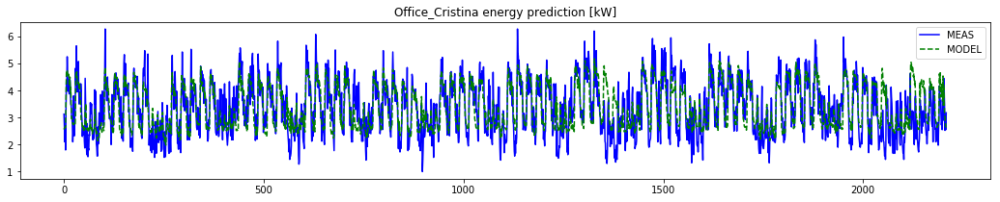

-------------------------
Modelling: Office_Jesus
Weatherfile: weather1.csv
alpha: 0.242
MAPE: 422.53
NMBE: -7.71
CVRSME: 27.4
R SQUARED: 0.51


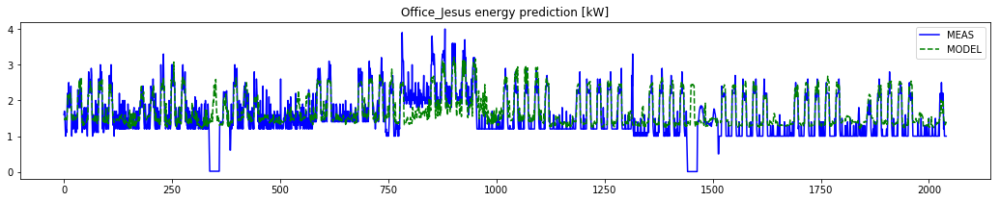

-------------------------
Modelling: Office_Jett
Weatherfile: weather1.csv
alpha: 0.99
MAPE: 270.37
NMBE: 13.23
CVRSME: 51.29
R SQUARED: 0.43


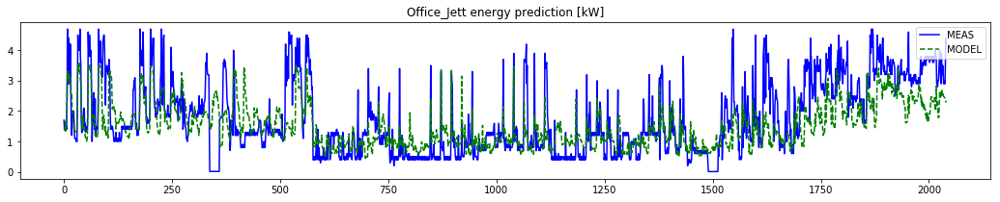

-------------------------
Modelling: Office_Jerry
Weatherfile: weather1.csv
alpha: 0.99
MAPE: 330.99
NMBE: -5.51
CVRSME: 36.66
R SQUARED: 0.74


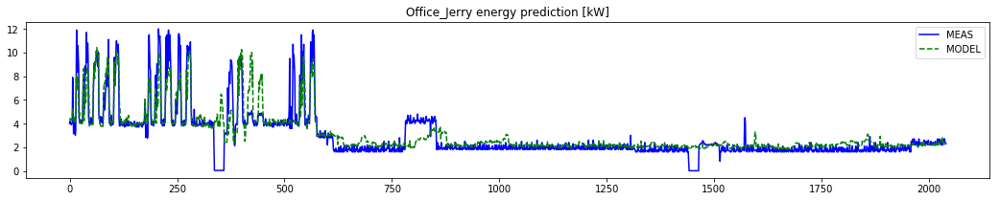

-------------------------
Modelling: Office_Lesa
Weatherfile: weather5.csv
alpha: 0.026
MAPE: 8.99
NMBE: 7.3
CVRSME: 13.91
R SQUARED: 0.75


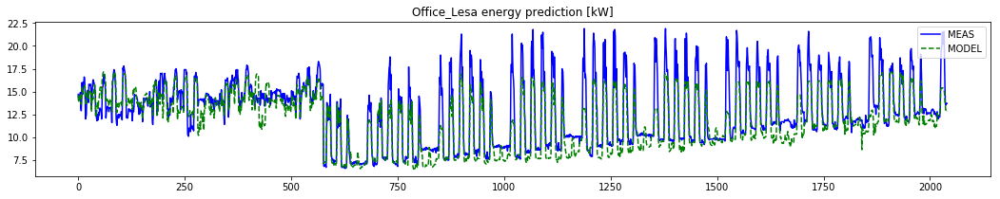

-------------------------
Modelling: Office_Jackie
Weatherfile: weather1.csv
alpha: 0.97
MAPE: 1456.13
NMBE: -1.38
CVRSME: 54.94
R SQUARED: 0.71


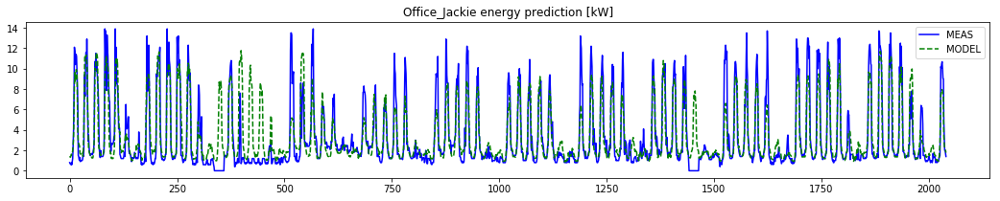

-------------------------
Modelling: Office_Marla
Weatherfile: weather3.csv
alpha: 0.99
MAPE: 8.3
NMBE: 1.82
CVRSME: 13.02
R SQUARED: 0.4


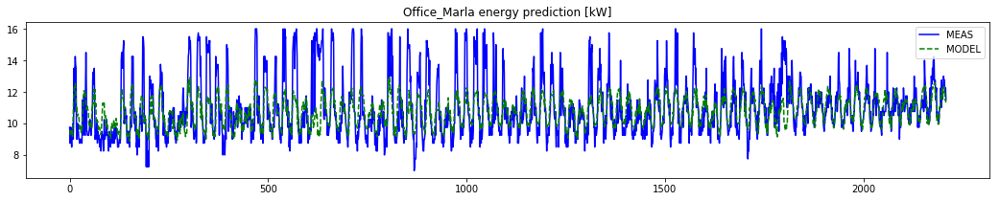

-------------------------
Modelling: Office_Maryann
Weatherfile: weather3.csv
alpha: 0.99
MAPE: 30.06
NMBE: -9.04
CVRSME: 31.01
R SQUARED: 0.61


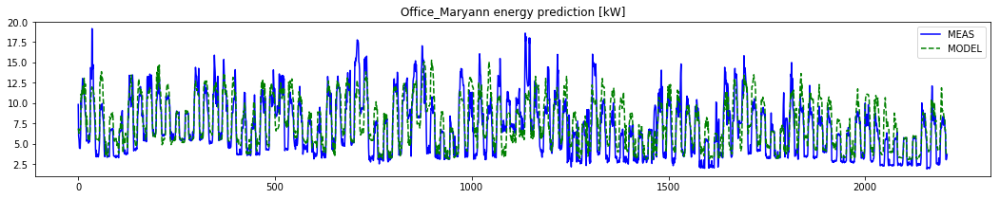

-------------------------
Modelling: Office_Myron
Weatherfile: weather3.csv
alpha: 0.022
MAPE: 12.57
NMBE: -2.46
CVRSME: 18.25
R SQUARED: 0.91


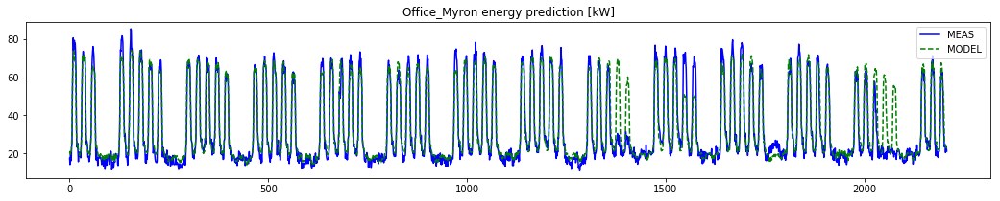

-------------------------
Modelling: Office_Conrad
Weatherfile: weather2.csv
alpha: 0.242
MAPE: 16.73
NMBE: -5.69
CVRSME: 19.47
R SQUARED: 0.44


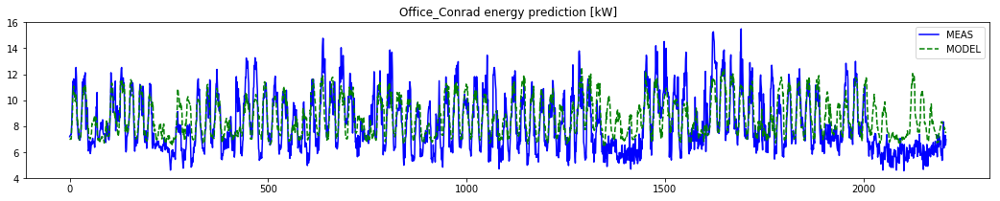

-------------------------
Modelling: Office_Mick
Weatherfile: weather3.csv
alpha: 0.032
MAPE: 7.73
NMBE: -0.63
CVRSME: 11.78
R SQUARED: 0.86


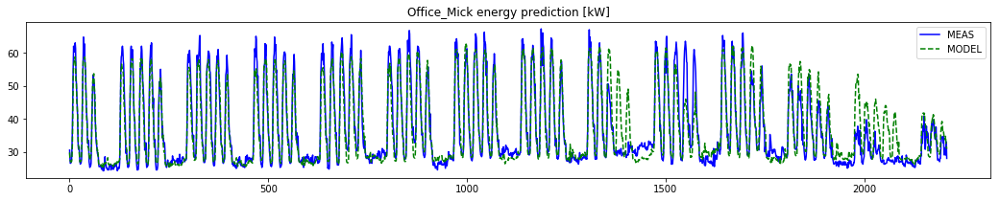

-------------------------
Modelling: Office_Jayden
Weatherfile: weather1.csv
alpha: 0.01
MAPE: 398.83
NMBE: -16.97
CVRSME: 43.57
R SQUARED: 0.74


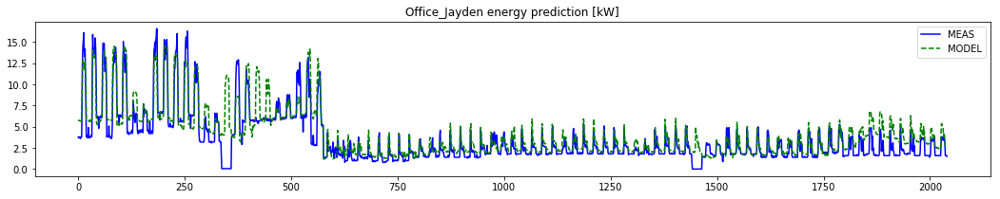

-------------------------
Modelling: Office_Moises
Weatherfile: weather3.csv
alpha: 0.015
MAPE: 9.63
NMBE: -1.63
CVRSME: 12.47
R SQUARED: 0.76


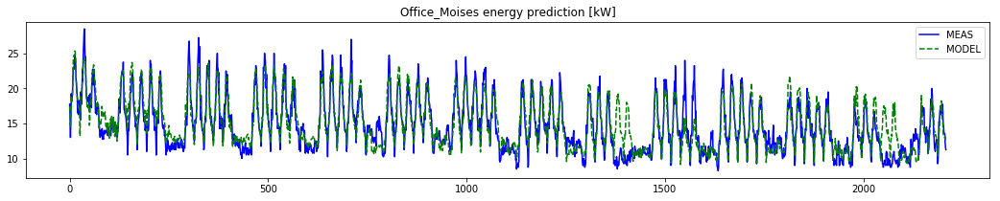

-------------------------
Modelling: Office_Tod
Weatherfile: weather8.csv
alpha: 0.432
MAPE: 12.09
NMBE: 3.13
CVRSME: 19.03
R SQUARED: 0.85


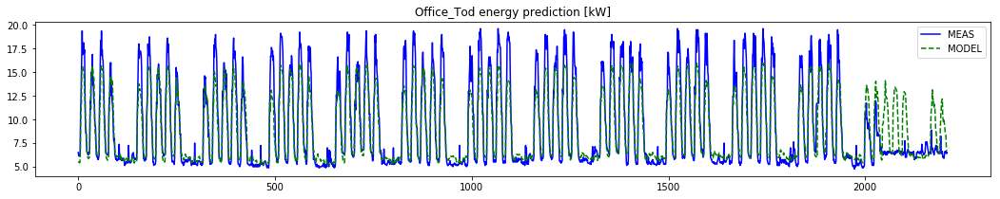

-------------------------
Modelling: Office_Marcus
Weatherfile: weather3.csv
alpha: 0.797
MAPE: 17.84
NMBE: -2.81
CVRSME: 19.92
R SQUARED: 0.8


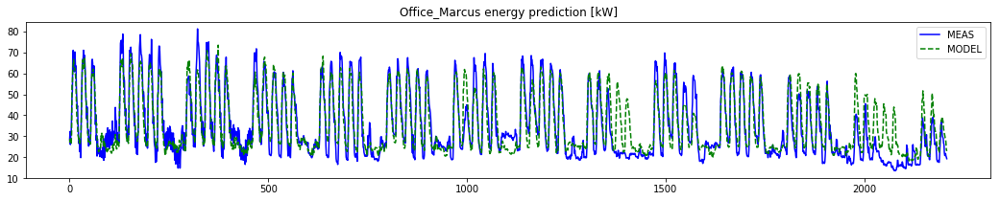

-------------------------
Modelling: Office_Bobbi
Weatherfile: weather7.csv
alpha: 0.098
MAPE: 18.08
NMBE: -4.17
CVRSME: 22.11
R SQUARED: 0.73


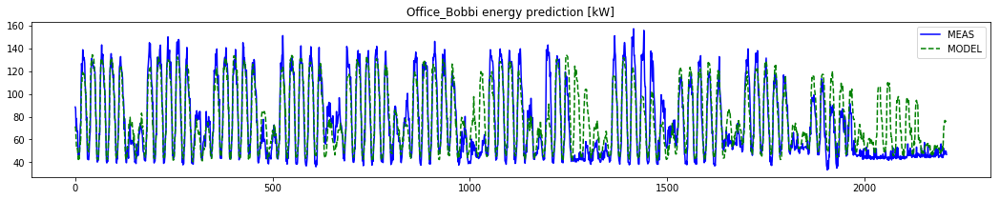

-------------------------
Modelling: Office_Skyler
Weatherfile: weather6.csv
alpha: 0.764
MAPE: 15.46
NMBE: -0.33
CVRSME: 21.3
R SQUARED: 0.84


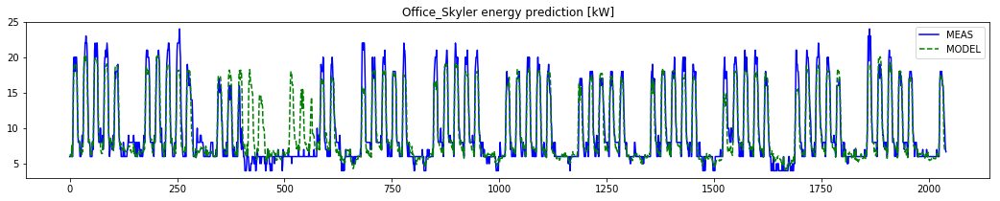

-------------------------
Modelling: Office_Marc
Weatherfile: weather3.csv
alpha: 0.296
MAPE: 9.98
NMBE: -0.87
CVRSME: 15.65
R SQUARED: 0.91


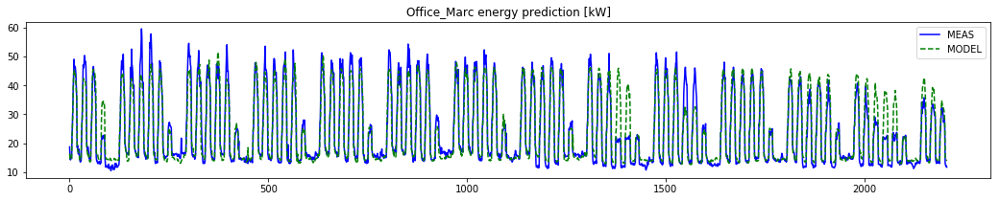

-------------------------
Modelling: Office_Mary
Weatherfile: weather3.csv
alpha: 0.601
MAPE: 12.39
NMBE: -1.52
CVRSME: 16.8
R SQUARED: 0.88


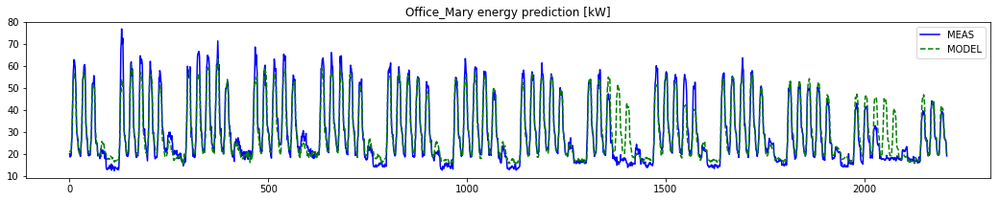

-------------------------
Modelling: Office_Ayesha
Weatherfile: weather0.csv
alpha: 0.846
MAPE: 13.32
NMBE: -0.98
CVRSME: 18.21
R SQUARED: 0.82


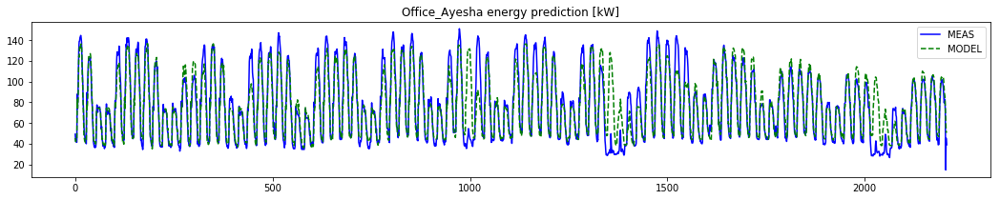

-------------------------
Modelling: Office_Monty
Weatherfile: weather3.csv
alpha: 0.098
MAPE: 11.95
NMBE: -2.03
CVRSME: 17.83
R SQUARED: 0.89


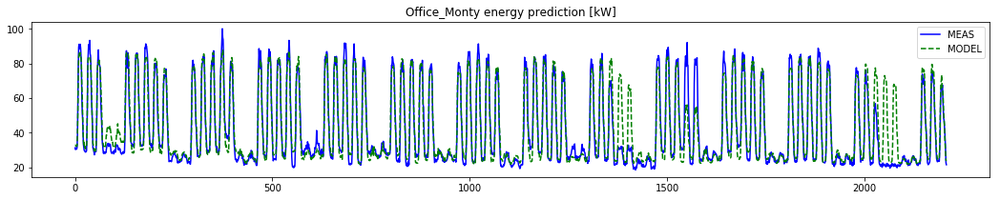

-------------------------
Modelling: Office_Joan
Weatherfile: weather1.csv
alpha: 0.781
MAPE: 603.56
NMBE: 1.54
CVRSME: 35.73
R SQUARED: 0.76


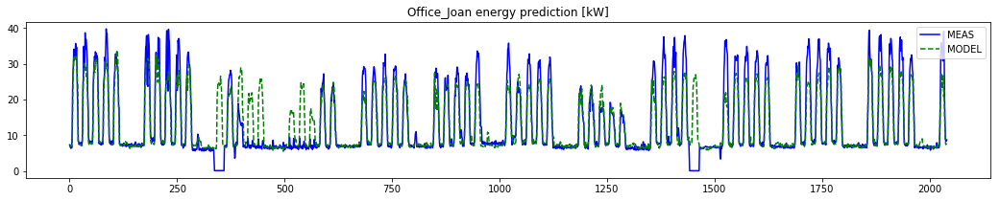

-------------------------
Modelling: Office_Marlon
Weatherfile: weather3.csv
alpha: 0.468
MAPE: 13.33
NMBE: 1.85
CVRSME: 19.48
R SQUARED: 0.87


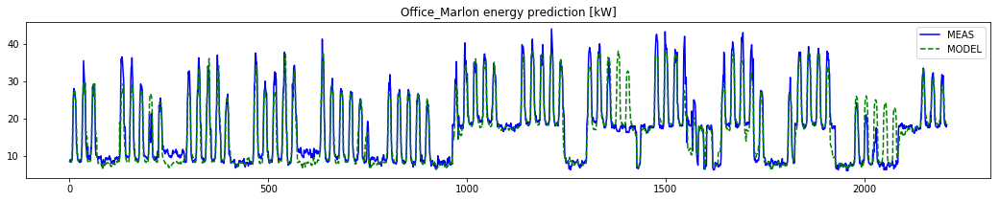

-------------------------
Modelling: Office_Javon
Weatherfile: weather1.csv
alpha: 0.918
MAPE: 619.47
NMBE: -0.82
CVRSME: 27.19
R SQUARED: 0.33


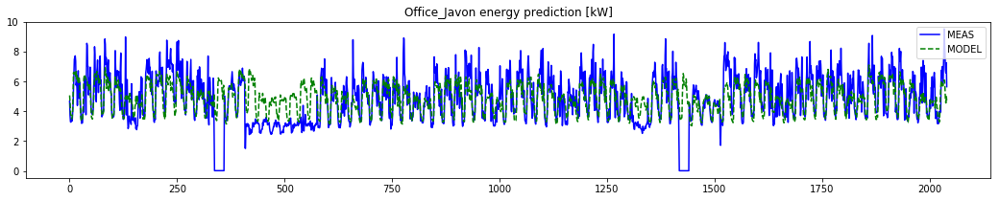

-------------------------
Modelling: Office_Jeanne
Weatherfile: weather1.csv
alpha: 0.398
MAPE: 1084.64
NMBE: 3.25
CVRSME: 37.68
R SQUARED: 0.82


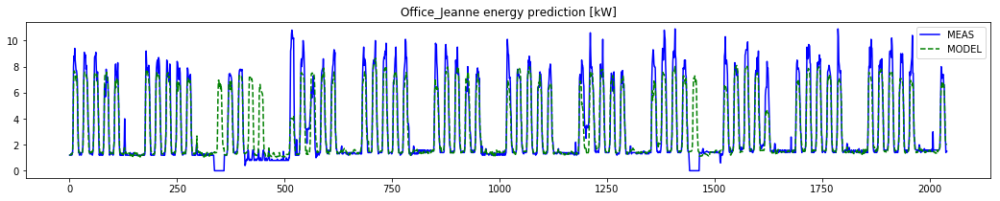

-------------------------
Modelling: Office_Pamela
Weatherfile: weather4.csv
alpha: 0.012
MAPE: 15.0
NMBE: -5.14
CVRSME: 18.74
R SQUARED: 0.78


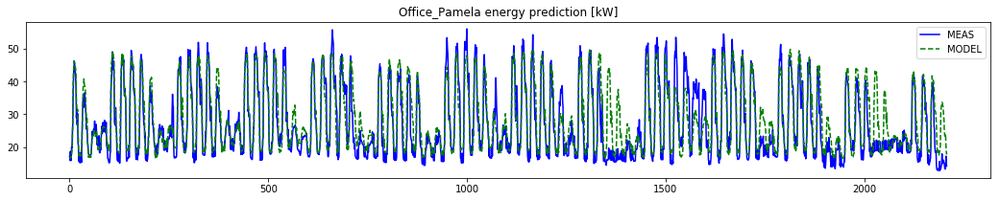

-------------------------
Modelling: Office_Allyson
Weatherfile: weather0.csv
alpha: 0.847
MAPE: 14.5
NMBE: 4.85
CVRSME: 31.94
R SQUARED: 0.73


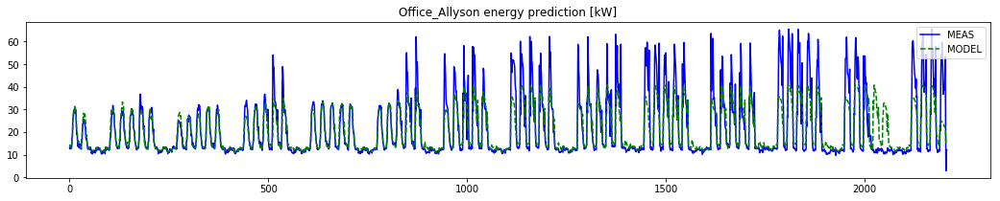

-------------------------
Modelling: Office_Amelie
Weatherfile: weather0.csv
alpha: 0.155
MAPE: 17.15
NMBE: 4.17
CVRSME: 23.61
R SQUARED: 0.87


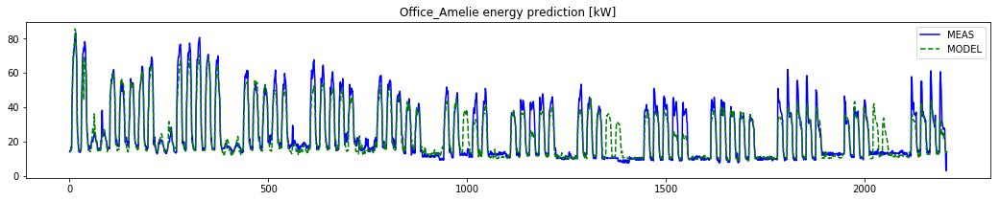

-------------------------
Modelling: Office_Maximus
Weatherfile: weather3.csv
alpha: 0.42
MAPE: 7.52
NMBE: -1.58
CVRSME: 12.52
R SQUARED: 0.98


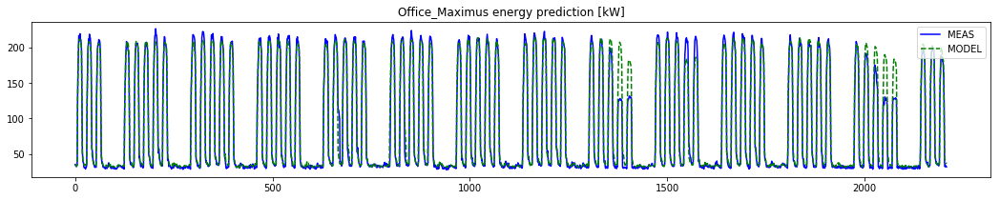

-------------------------
Modelling: Office_Ava
Weatherfile: weather0.csv
alpha: 0.17
MAPE: 11.61
NMBE: 2.64
CVRSME: 23.68
R SQUARED: 0.83


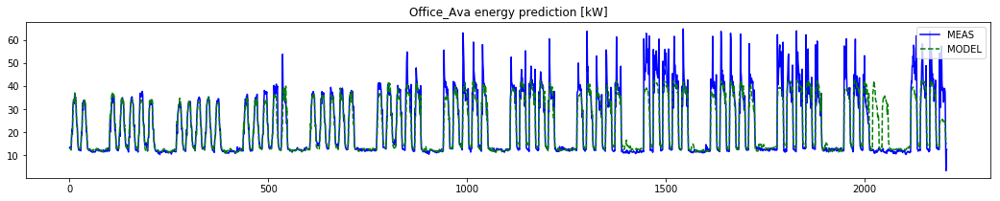

-------------------------
Modelling: Office_Michael
Weatherfile: weather3.csv
alpha: 0.803
MAPE: 10.05
NMBE: -0.43
CVRSME: 14.62
R SQUARED: 0.9


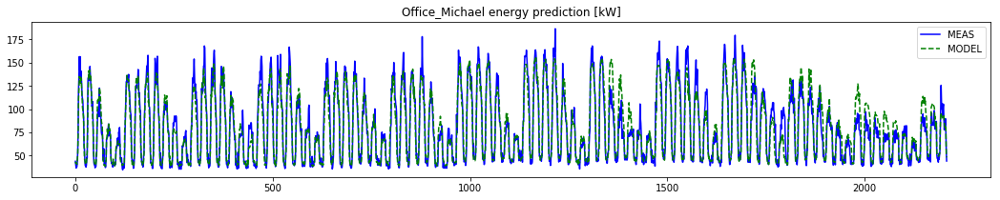

-------------------------
Modelling: Office_Caleb
Weatherfile: weather2.csv
alpha: 0.493
MAPE: 10.23
NMBE: -3.7
CVRSME: 17.75
R SQUARED: 0.83


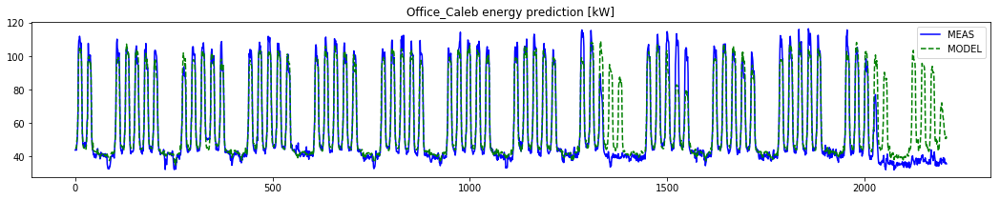

-------------------------
Modelling: Office_Scottie
Weatherfile: weather6.csv
alpha: 0.289
MAPE: 15.21
NMBE: -3.66
CVRSME: 19.22
R SQUARED: 0.84


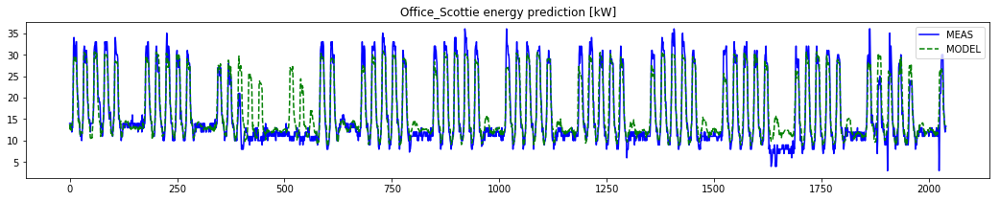

-------------------------
Modelling: Office_Cecelia
Weatherfile: weather2.csv
alpha: 0.957
MAPE: 17.02
NMBE: -2.79
CVRSME: 21.51
R SQUARED: 0.47


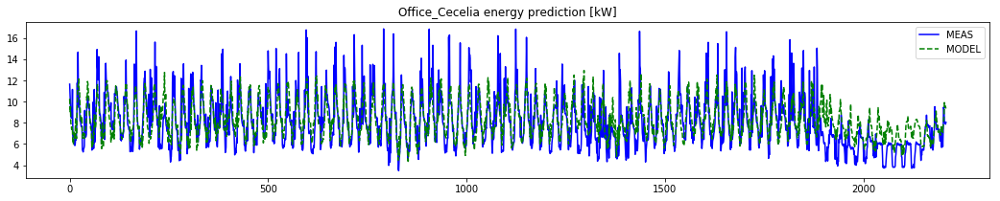

-------------------------
Modelling: Office_Nelson
Weatherfile: weather9.csv
alpha: 0.026
MAPE: 9.88
NMBE: -3.57
CVRSME: 12.92
R SQUARED: 0.83


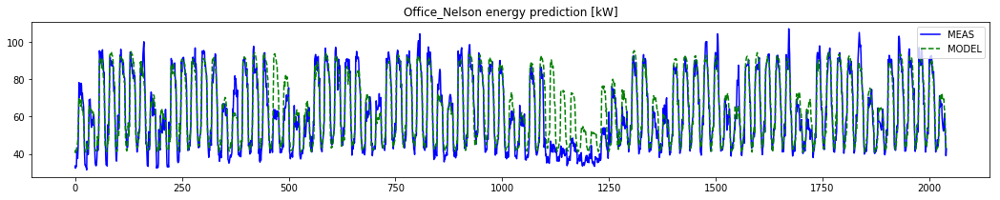

-------------------------
Modelling: Office_Abbey
Weatherfile: weather0.csv
alpha: 0.381
MAPE: 11.23
NMBE: -0.43
CVRSME: 16.52
R SQUARED: 0.79


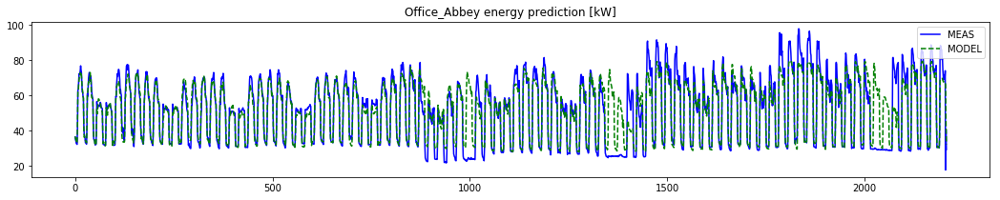

-------------------------
Modelling: Office_John
Weatherfile: weather1.csv
alpha: 0.241
MAPE: 325.93
NMBE: 0.17
CVRSME: 24.14
R SQUARED: 0.64


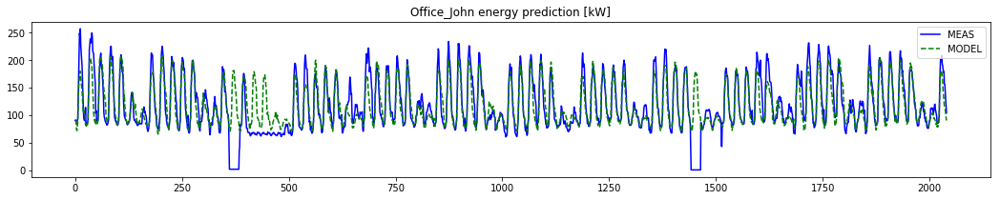

-------------------------
Modelling: Office_Moses
Weatherfile: weather3.csv
alpha: 0.032
MAPE: 5.93
NMBE: 0.29
CVRSME: 7.62
R SQUARED: 0.74


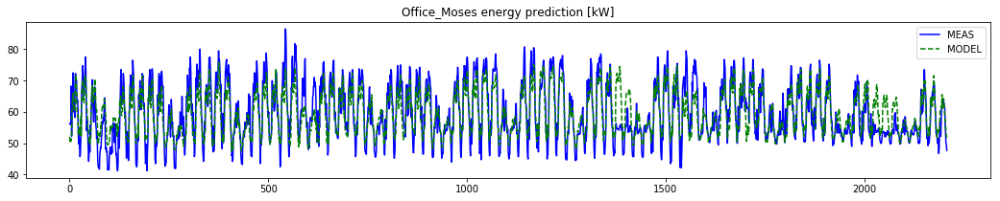

-------------------------
Modelling: Office_Martha
Weatherfile: weather3.csv
alpha: 0.384
MAPE: 10.33
NMBE: 0.22
CVRSME: 15.91
R SQUARED: 0.9


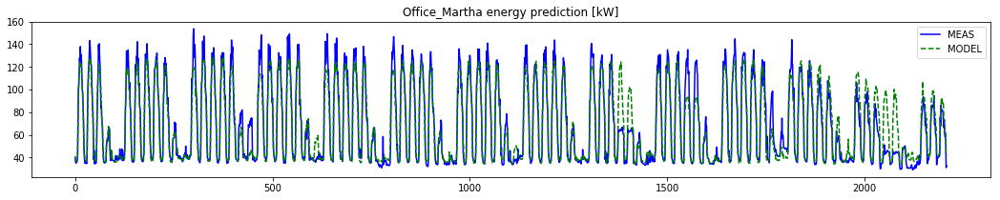

-------------------------
Modelling: Office_Mercedes
Weatherfile: weather3.csv
alpha: 0.016
MAPE: 7.17
NMBE: -0.66
CVRSME: 9.88
R SQUARED: 0.8


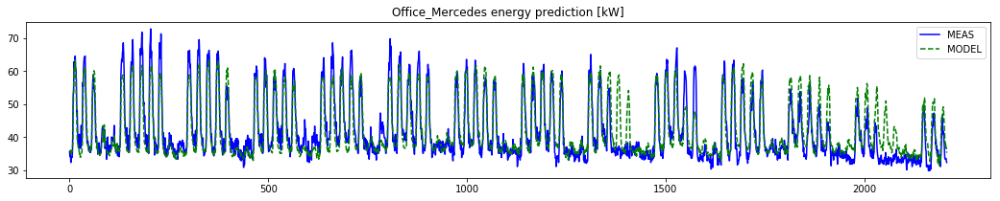

-------------------------
Modelling: Office_Mat
Weatherfile: weather3.csv
alpha: 0.011
MAPE: 7.06
NMBE: -0.3
CVRSME: 10.83
R SQUARED: 0.87


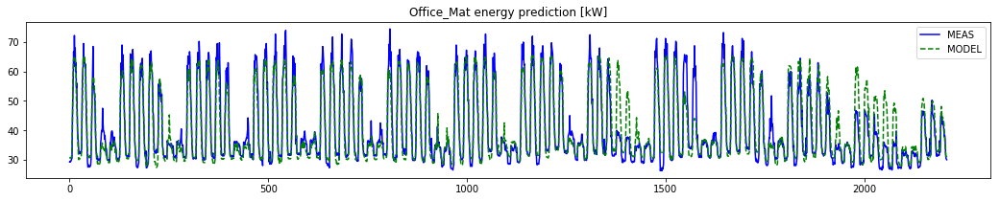

-------------------------
Modelling: Office_Clifton
Weatherfile: weather2.csv
alpha: 0.299
MAPE: 17.86
NMBE: -4.7
CVRSME: 22.04
R SQUARED: 0.61


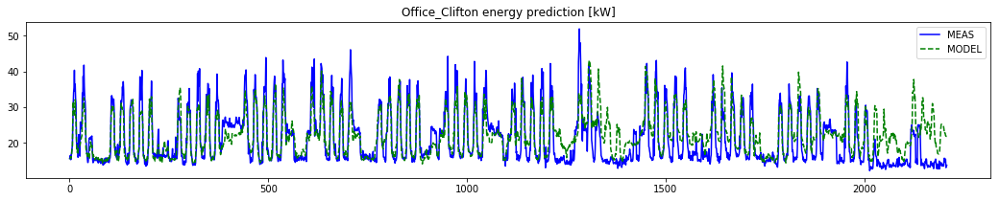

-------------------------
Modelling: Office_Marilyn
Weatherfile: weather3.csv
alpha: 0.638
MAPE: 14.65
NMBE: 0.17
CVRSME: 20.91
R SQUARED: 0.78


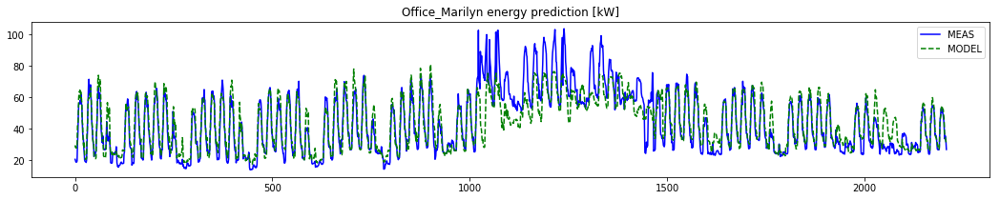

-------------------------
Modelling: Office_Malik
Weatherfile: weather3.csv
alpha: 0.29
MAPE: 10.32
NMBE: -0.44
CVRSME: 15.33
R SQUARED: 0.81


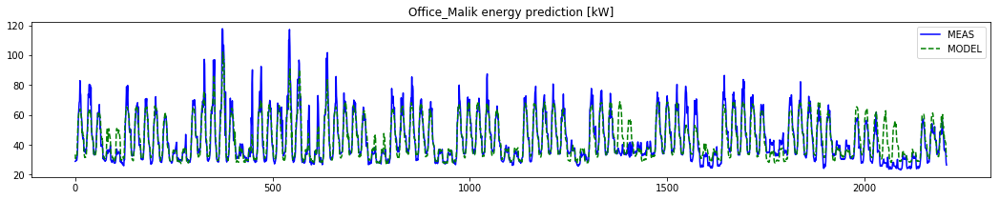

-------------------------
Modelling: Office_Benjamin
Weatherfile: weather7.csv
alpha: 0.611
MAPE: 7.52
NMBE: 1.36
CVRSME: 12.76
R SQUARED: 0.81


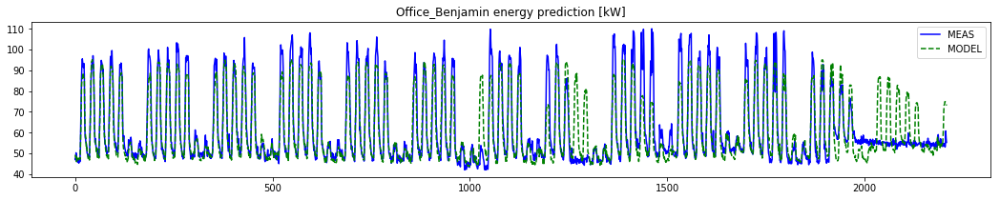

-------------------------
Modelling: Office_Mohammed
Weatherfile: weather3.csv
alpha: 0.242
MAPE: 2.42
NMBE: -0.63
CVRSME: 3.21
R SQUARED: 0.7


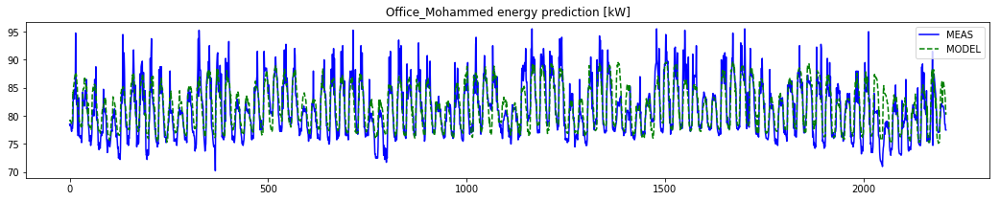

-------------------------
Modelling: Office_Bianca
Weatherfile: weather7.csv
alpha: 0.384
MAPE: 27.5
NMBE: -4.29
CVRSME: 36.01
R SQUARED: 0.76


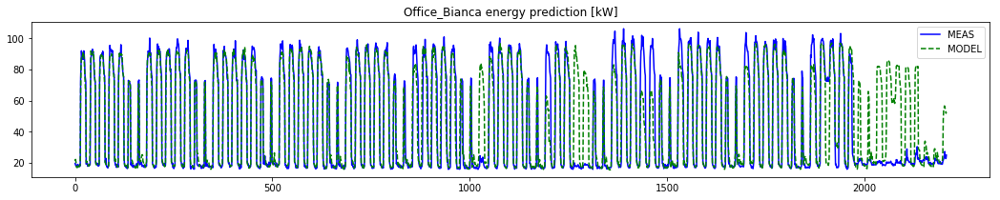

-------------------------
Modelling: Office_Benthe
Weatherfile: weather7.csv
alpha: 0.01
MAPE: 9.65
NMBE: -6.68
CVRSME: 14.96
R SQUARED: 0.73


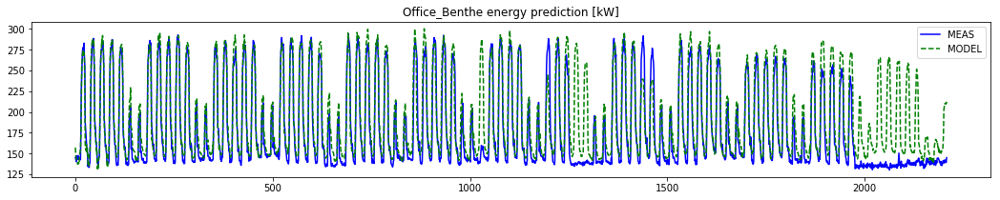

-------------------------
Modelling: Office_Micheal
Weatherfile: weather3.csv
alpha: 0.436
MAPE: 8.28
NMBE: -0.49
CVRSME: 12.99
R SQUARED: 0.93


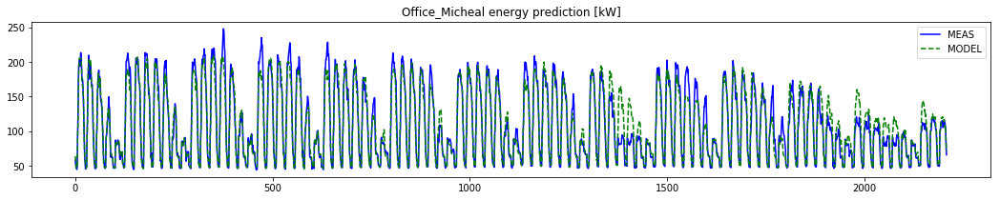

-------------------------
Modelling: Office_Corbin
Weatherfile: weather2.csv
alpha: 0.049
MAPE: 7.54
NMBE: 0.11
CVRSME: 10.08
R SQUARED: 0.74


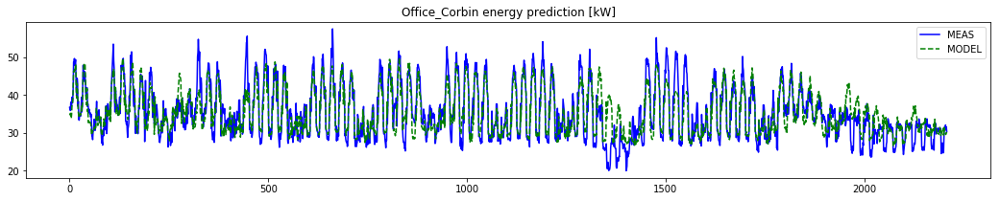

-------------------------


In [14]:
MAPE_data, NMBE_data, CVRSME_data, RSQUARED_data, alpha_data = get_model(buildingnames[0:50], meta, temporal)

In [15]:
metrics_office = pd.DataFrame([MAPE_data, NMBE_data, CVRSME_data, RSQUARED_data, alpha_data]).T
metrics_office.columns = ["MAPE", "NMBE", "CVRSME", "RSQUARED", "alpha"]
metrics_office

,MAPE,NMBE,CVRSME,RSQUARED,alpha
Office_Abbey,11.231509,-0.429393,16.520595,0.786927,0.381260
Office_Allyson,14.498225,4.851730,31.940726,0.733711,0.847020
Office_Amelie,17.146691,4.167227,23.614233,0.871117,0.154884
Office_Ava,11.610469,2.637040,23.680044,0.831516,0.170216
Office_Ayesha,13.322825,-0.979027,18.213055,0.818260,0.846129
Office_Benjamin,7.519419,1.360700,12.764195,0.805191,0.611009
Office_Benthe,9.646097,-6.682344,14.959422,0.726792,0.010496
Office_Bianca,27.502505,-4.286512,36.013421,0.757841,0.383993
Office_Bobbi,18.075879,-4.167398,22.109164,0.734533,0.098367
Office_Caleb,10.233593,-3.695658,17.746954,0.832373,0.493372


array([[<matplotlib.axes._subplots.AxesSubplot object at 0x000001CF3A0E1048>,
      dtype=object)

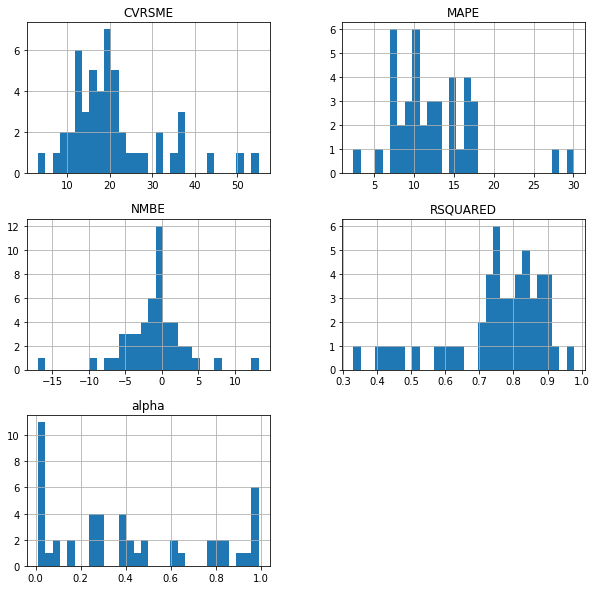

In [16]:
metrics_office[metrics_office<100].hist(bins=30, figsize=(10,10))

# Let's look at all the other building types also

## Let's do dormitories now

In [17]:
buildingnames_dorm = temporal.columns[temporal.columns.str.contains("UnivDorm")]
buildingnames_dorm

Index(['UnivDorm_Una', 'UnivDorm_Claudia', 'UnivDorm_Carla', 'UnivDorm_Prince',
       'UnivDorm_Chelsey', 'UnivDorm_Christopher', 'UnivDorm_Cheyenne',
       'UnivDorm_Patti', 'UnivDorm_Jeannette', 'UnivDorm_Christi',
       'UnivDorm_Marlene', 'UnivDorm_Cheri', 'UnivDorm_Lorraine',
       'UnivDorm_Celeste', 'UnivDorm_Patty', 'UnivDorm_Adan', 'UnivDorm_Cian',
       'UnivDorm_Curtis', 'UnivDorm_Leonard', 'UnivDorm_Patrice',
       'UnivDorm_Candace', 'UnivDorm_Clayton', 'UnivDorm_Ahmad',
       'UnivDorm_April', 'UnivDorm_Corey', 'UnivDorm_Cooper',
       'UnivDorm_Malachi', 'UnivDorm_Mathew', 'UnivDorm_Ashleigh',
       'UnivDorm_Piper', 'UnivDorm_Colton', 'UnivDorm_Paola',
       'UnivDorm_Lawrence', 'UnivDorm_Alonzo', 'UnivDorm_Chester',
       'UnivDorm_Phillip', 'UnivDorm_Mitch', 'UnivDorm_Casey',
       'UnivDorm_Leticia', 'UnivDorm_Leslie', 'UnivDorm_Poppy',
       'UnivDorm_Antonio', 'UnivDorm_Malcolm', 'UnivDorm_Ciaran',
       'UnivDorm_Alyssa', 'UnivDorm_Phoebe', 'UnivDorm

Modelling: UnivDorm_Una
Weatherfile: weather10.csv
alpha: 0.755
MAPE: 19.15
NMBE: 1.16
CVRSME: 20.39
R SQUARED: 0.64


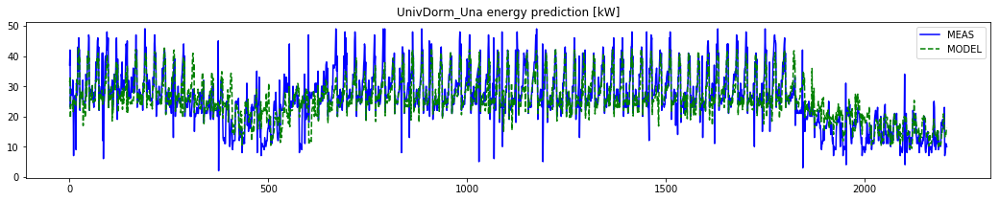

-------------------------
Modelling: UnivDorm_Claudia
Weatherfile: weather2.csv
alpha: 0.016
MAPE: 9.21
NMBE: -1.97
CVRSME: 11.43
R SQUARED: 0.78


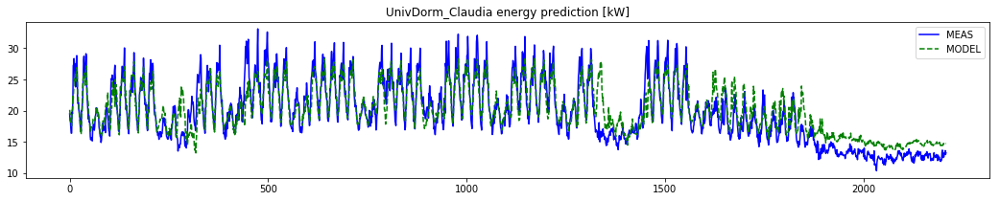

-------------------------
Modelling: UnivDorm_Carla
Weatherfile: weather2.csv
alpha: 0.422
MAPE: 10.62
NMBE: -1.93
CVRSME: 12.57
R SQUARED: 0.48


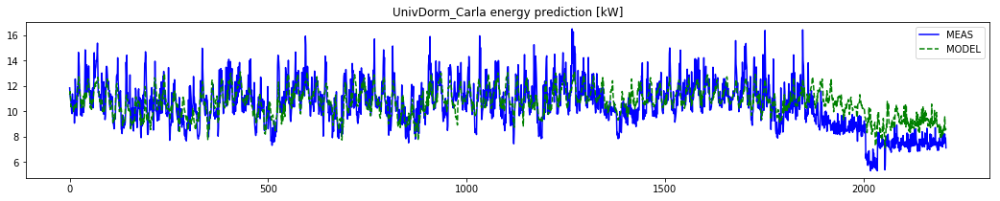

-------------------------
Modelling: UnivDorm_Prince
Weatherfile: weather4.csv
alpha: 0.011
MAPE: 7.54
NMBE: 0.38
CVRSME: 10.28
R SQUARED: 0.66


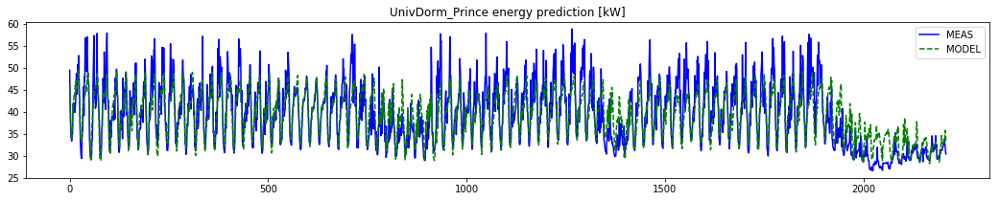

-------------------------
Modelling: UnivDorm_Chelsey
Weatherfile: weather2.csv
alpha: 0.616
MAPE: 16.43
NMBE: -1.67
CVRSME: 17.74
R SQUARED: 0.6


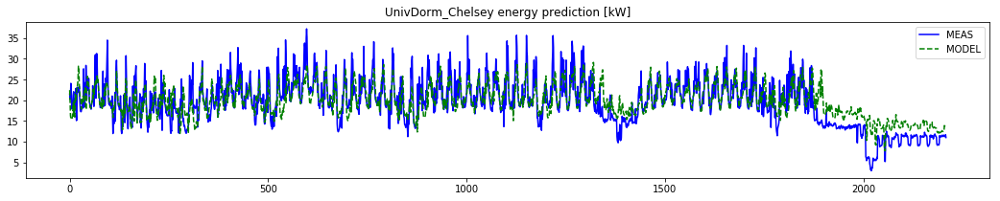

-------------------------
Modelling: UnivDorm_Christopher
Weatherfile: weather2.csv
alpha: 0.388
MAPE: 15.04
NMBE: 0.3
CVRSME: 18.43
R SQUARED: 0.53


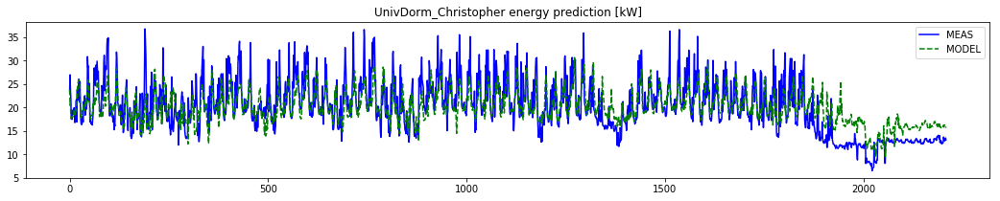

-------------------------
Modelling: UnivDorm_Cheyenne
Weatherfile: weather2.csv
alpha: 0.031
MAPE: 9.04
NMBE: -0.45
CVRSME: 11.41
R SQUARED: 0.61


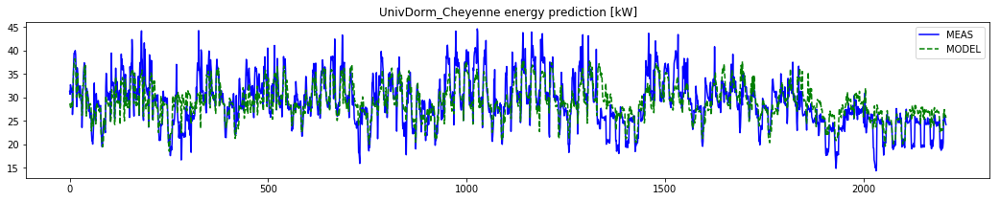

-------------------------
Modelling: UnivDorm_Patti
Weatherfile: weather4.csv
alpha: 0.01
MAPE: 14.4
NMBE: 1.44
CVRSME: 19.44
R SQUARED: 0.64


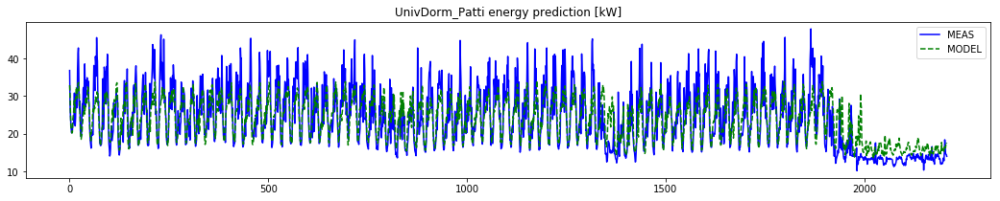

-------------------------
Modelling: UnivDorm_Jeannette
Weatherfile: weather1.csv
alpha: 0.987
MAPE: 454.44
NMBE: 9.02
CVRSME: 33.97
R SQUARED: 0.67


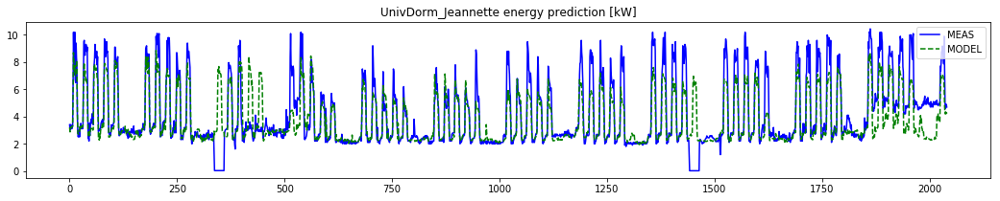

-------------------------
Modelling: UnivDorm_Christi
Weatherfile: weather2.csv
alpha: 0.404
MAPE: 16.46
NMBE: 0.17
CVRSME: 18.25
R SQUARED: 0.63


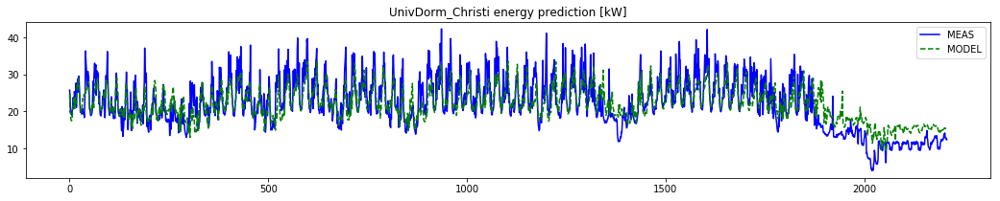

-------------------------
Modelling: UnivDorm_Marlene
Weatherfile: weather3.csv
alpha: 0.023
MAPE: 9.04
NMBE: -0.81
CVRSME: 11.88
R SQUARED: 0.75


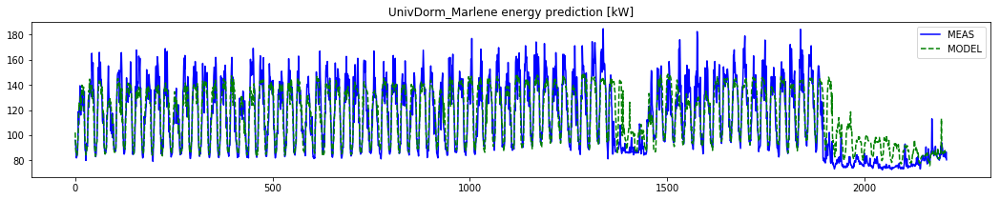

-------------------------
Modelling: UnivDorm_Cheri
Weatherfile: weather2.csv
alpha: 0.889
MAPE: 8.96
NMBE: -0.97
CVRSME: 9.81
R SQUARED: 0.82


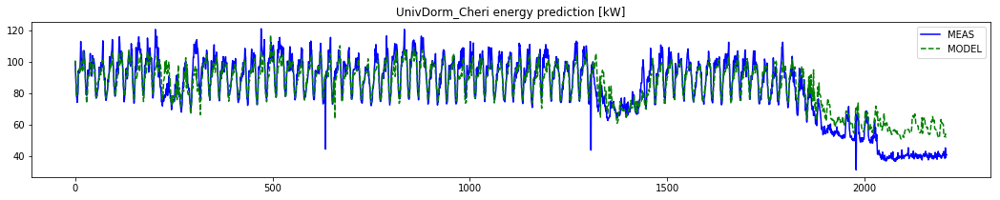

-------------------------
Modelling: UnivDorm_Lorraine
Weatherfile: weather5.csv
alpha: 0.01
MAPE: 7.99
NMBE: -0.47
CVRSME: 10.15
R SQUARED: 0.9


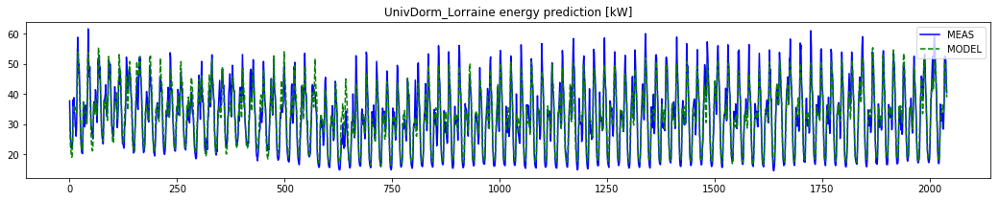

-------------------------
Modelling: UnivDorm_Celeste
Weatherfile: weather2.csv
alpha: 0.874
MAPE: 9.16
NMBE: -2.35
CVRSME: 10.56
R SQUARED: 0.76


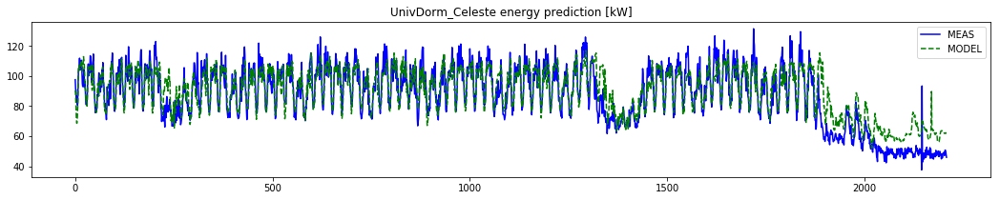

-------------------------
Modelling: UnivDorm_Patty
Weatherfile: weather4.csv
alpha: 0.01
MAPE: 5.36
NMBE: 2.61
CVRSME: 7.06
R SQUARED: 0.68


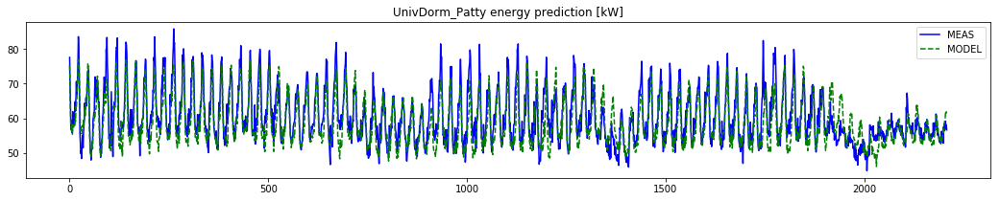

-------------------------
Modelling: UnivDorm_Adan
Weatherfile: weather0.csv
alpha: 0.027
MAPE: 13.8
NMBE: -3.31
CVRSME: 14.7
R SQUARED: 0.84


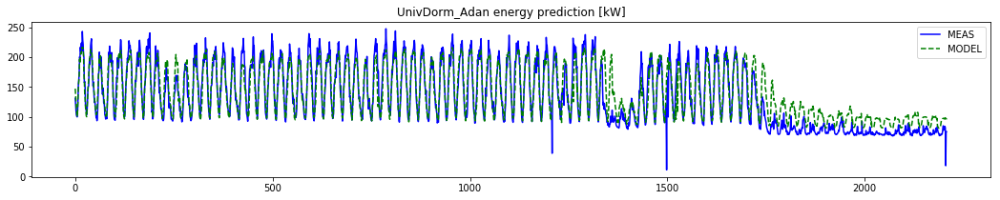

-------------------------
Modelling: UnivDorm_Cian
Weatherfile: weather2.csv
alpha: 0.242
MAPE: 9.48
NMBE: -1.68
CVRSME: 11.38
R SQUARED: 0.8


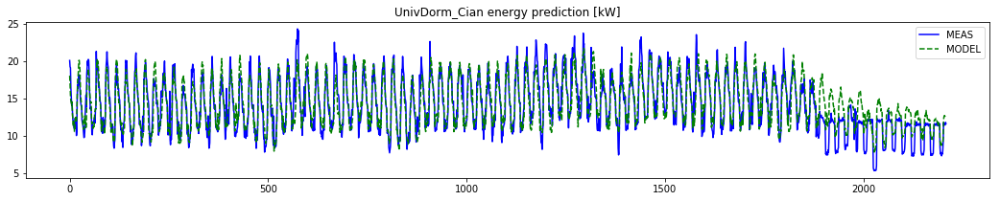

-------------------------
Modelling: UnivDorm_Curtis
Weatherfile: weather2.csv
alpha: 0.013
MAPE: 11.98
NMBE: -5.77
CVRSME: 14.72
R SQUARED: 0.23


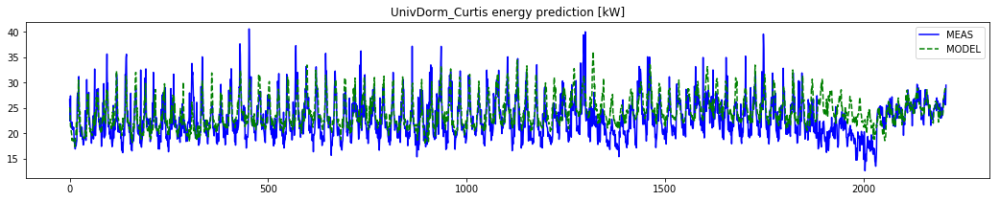

-------------------------
Modelling: UnivDorm_Leonard
Weatherfile: weather5.csv
alpha: 0.01
MAPE: 8.75
NMBE: -0.66
CVRSME: 11.15
R SQUARED: 0.9


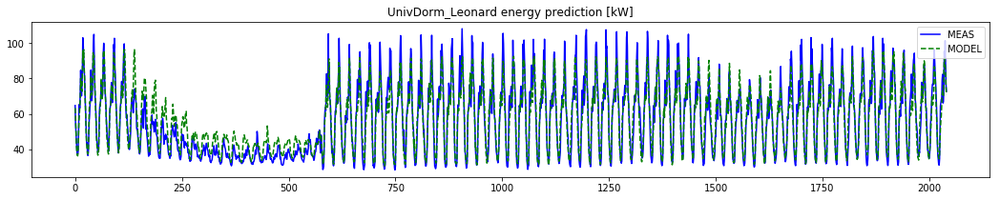

-------------------------
Modelling: UnivDorm_Patrice
Weatherfile: weather4.csv
alpha: 0.01
MAPE: 13.32
NMBE: -1.2
CVRSME: 16.33
R SQUARED: 0.61


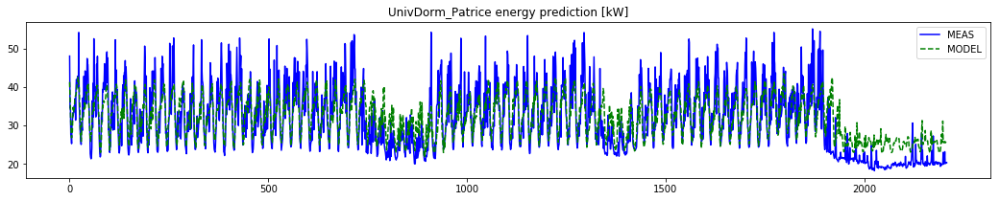

-------------------------
Modelling: UnivDorm_Candace
Weatherfile: weather2.csv
alpha: 0.242
MAPE: 8.75
NMBE: 2.18
CVRSME: 12.34
R SQUARED: 0.37


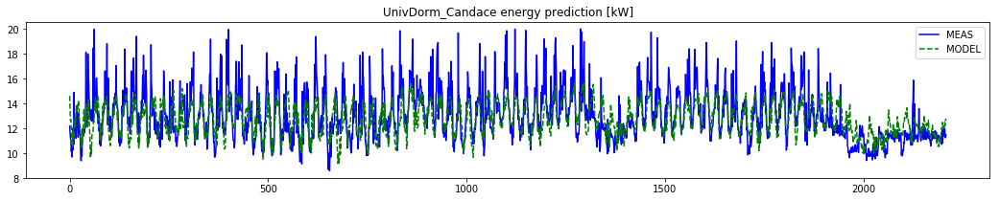

-------------------------
Modelling: UnivDorm_Clayton
Weatherfile: weather2.csv
alpha: 0.01
MAPE: 11.42
NMBE: -2.37
CVRSME: 12.5
R SQUARED: 0.64


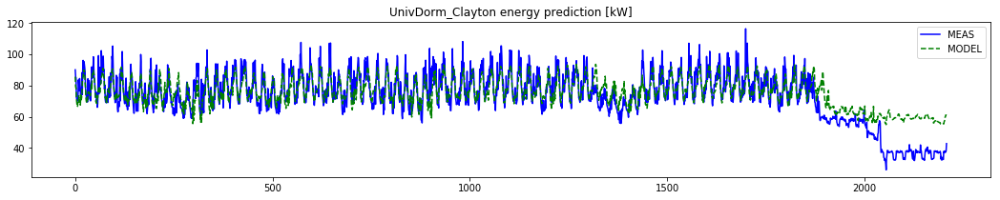

-------------------------
Modelling: UnivDorm_Ahmad
Weatherfile: weather0.csv
alpha: 0.01
MAPE: 8.9
NMBE: 4.34
CVRSME: 12.49
R SQUARED: 0.69


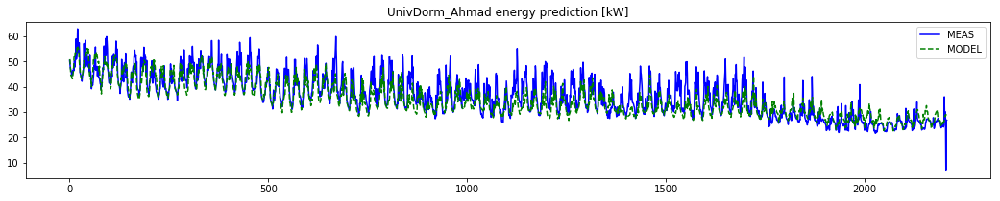

-------------------------
Modelling: UnivDorm_April
Weatherfile: weather0.csv
alpha: 0.011
MAPE: 6.78
NMBE: -1.14
CVRSME: 8.57
R SQUARED: 0.85


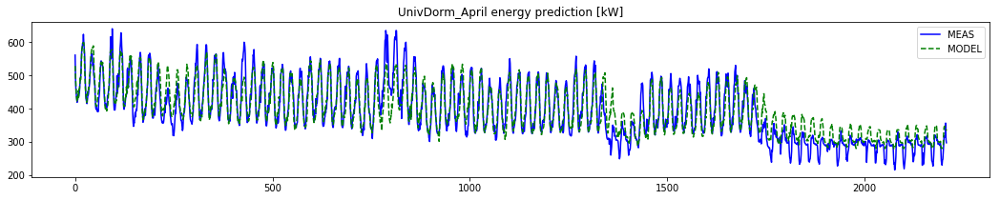

-------------------------
Modelling: UnivDorm_Corey
Weatherfile: weather2.csv
alpha: 0.011
MAPE: 15.85
NMBE: -3.07
CVRSME: 19.3
R SQUARED: 0.39


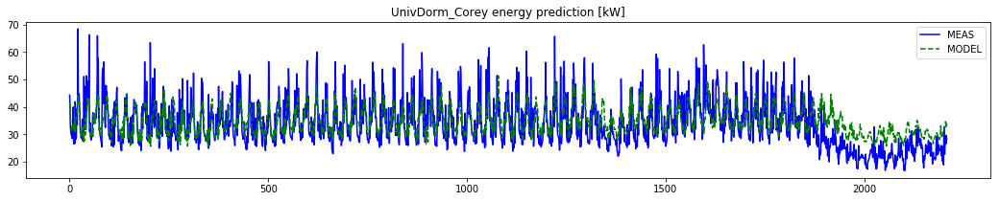

-------------------------
Modelling: UnivDorm_Cooper
Weatherfile: weather2.csv
alpha: 0.759
MAPE: 8.09
NMBE: -1.07
CVRSME: 9.64
R SQUARED: 0.82


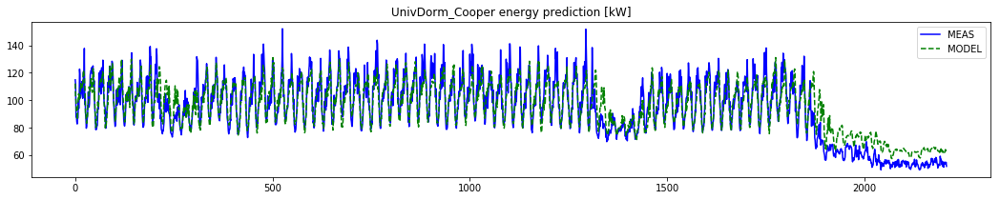

-------------------------
Modelling: UnivDorm_Malachi
Weatherfile: weather3.csv
alpha: 0.016
MAPE: 9.17
NMBE: -0.22
CVRSME: 11.57
R SQUARED: 0.7


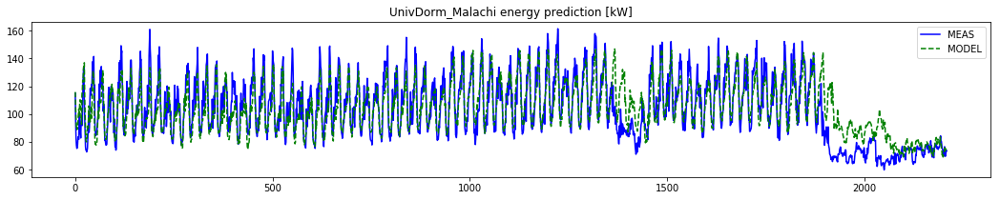

-------------------------
Modelling: UnivDorm_Mathew
Weatherfile: weather3.csv
alpha: 0.018
MAPE: 10.42
NMBE: 0.2
CVRSME: 12.18
R SQUARED: 0.8


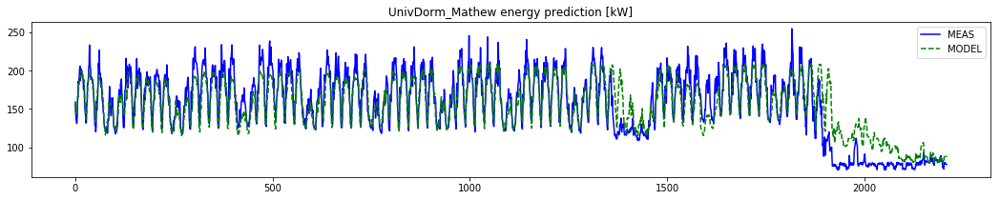

-------------------------
Modelling: UnivDorm_Ashleigh
Weatherfile: weather0.csv
alpha: 0.015
MAPE: 3.5
NMBE: 0.21
CVRSME: 5.21
R SQUARED: 0.74


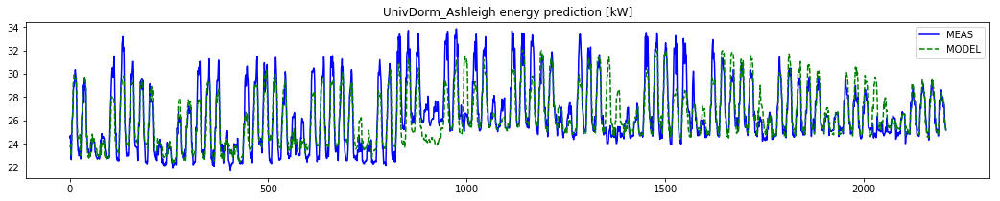

-------------------------
Modelling: UnivDorm_Piper
Weatherfile: weather4.csv
alpha: 0.011
MAPE: 6.99
NMBE: 1.06
CVRSME: 9.53
R SQUARED: 0.69


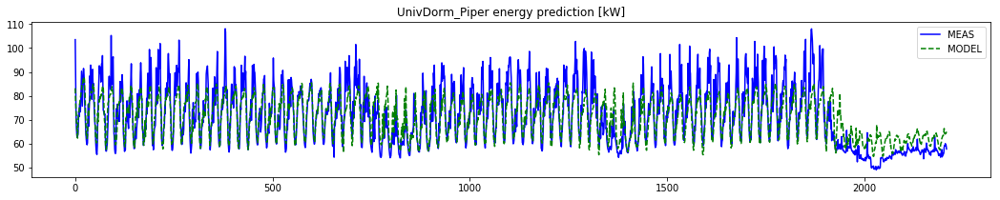

-------------------------
Modelling: UnivDorm_Colton
Weatherfile: weather2.csv
alpha: 0.018
MAPE: 14.67
NMBE: -4.37
CVRSME: 17.63
R SQUARED: 0.45


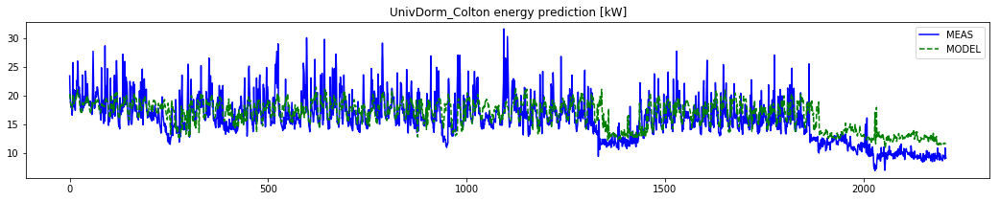

-------------------------
Modelling: UnivDorm_Paola
Weatherfile: weather4.csv
alpha: 0.01
MAPE: 8.42
NMBE: -3.36
CVRSME: 10.46
R SQUARED: 0.8


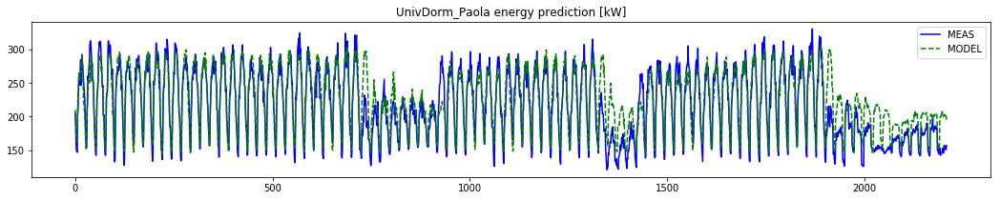

-------------------------
Modelling: UnivDorm_Lawrence
Weatherfile: weather5.csv
alpha: 0.011
MAPE: 16.76
NMBE: 1.21
CVRSME: 20.14
R SQUARED: 0.55


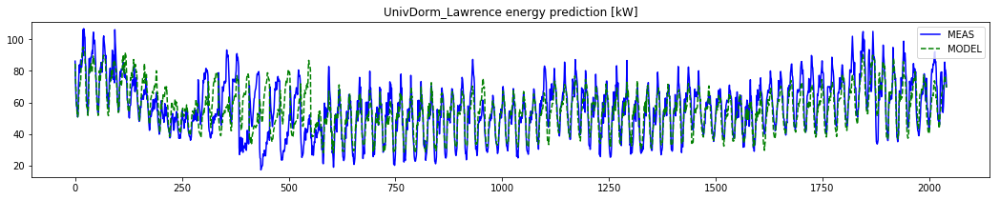

-------------------------
Modelling: UnivDorm_Alonzo
Weatherfile: weather0.csv
alpha: 0.01
MAPE: 6.8
NMBE: 1.68
CVRSME: 9.51
R SQUARED: 0.55


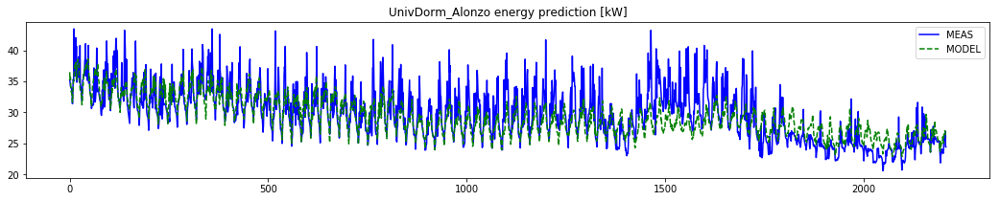

-------------------------
Modelling: UnivDorm_Chester
Weatherfile: weather2.csv
alpha: 0.01
MAPE: 5.05
NMBE: -1.43
CVRSME: 6.29
R SQUARED: 0.74


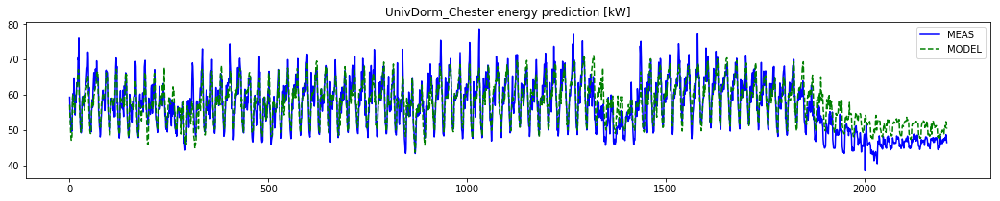

-------------------------
Modelling: UnivDorm_Phillip
Weatherfile: weather4.csv
alpha: 0.328
MAPE: 9.26
NMBE: -0.42
CVRSME: 12.11
R SQUARED: 0.49


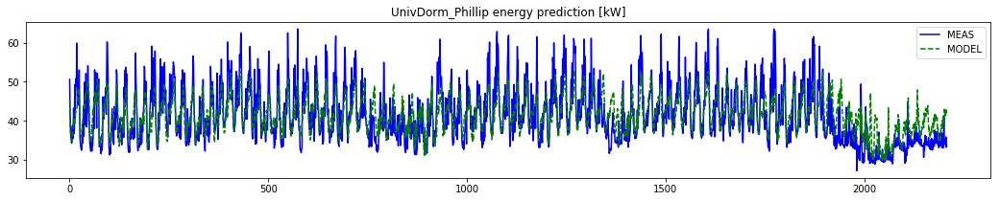

-------------------------
Modelling: UnivDorm_Mitch
Weatherfile: weather3.csv
alpha: 0.011
MAPE: 10.97
NMBE: -1.4
CVRSME: 14.41
R SQUARED: 0.5


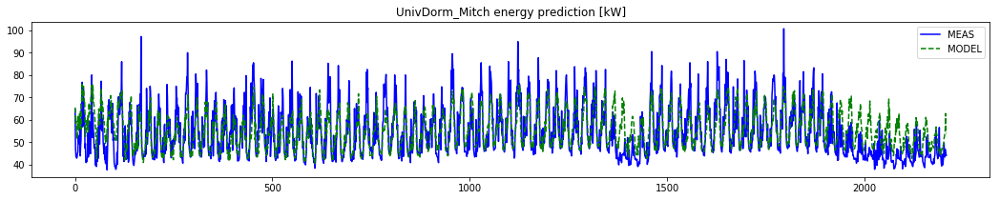

-------------------------
Modelling: UnivDorm_Casey
Weatherfile: weather2.csv
alpha: 0.258
MAPE: 12.55
NMBE: -1.89
CVRSME: 15.6
R SQUARED: 0.36


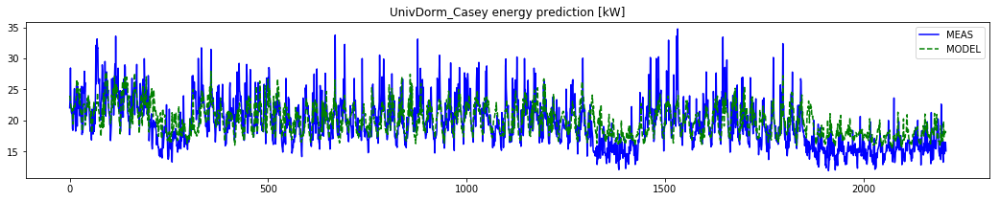

-------------------------
Modelling: UnivDorm_Leticia
Weatherfile: weather5.csv
alpha: 0.136
MAPE: 6.82
NMBE: -0.17
CVRSME: 9.55
R SQUARED: 0.87


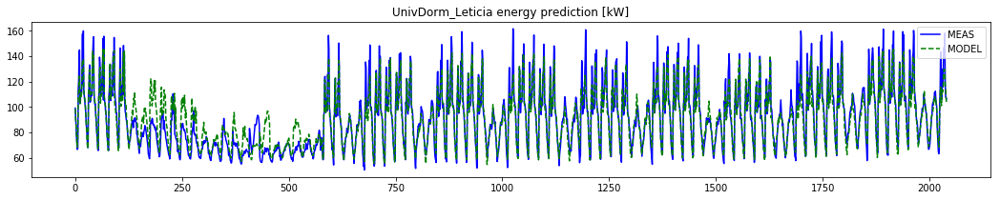

-------------------------
Modelling: UnivDorm_Leslie
Weatherfile: weather5.csv
alpha: 0.803
MAPE: 6.74
NMBE: 0.31
CVRSME: 8.55
R SQUARED: 0.77


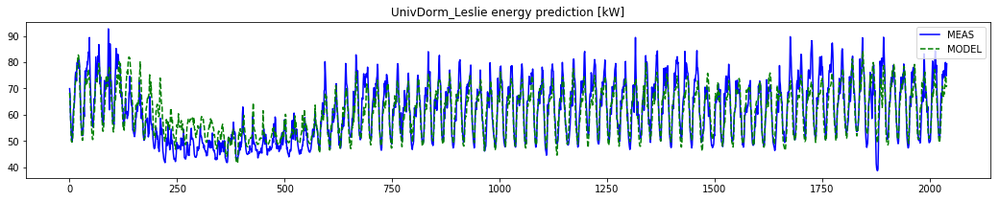

-------------------------
Modelling: UnivDorm_Poppy
Weatherfile: weather4.csv
alpha: 0.01
MAPE: 9.17
NMBE: -1.13
CVRSME: 12.04
R SQUARED: 0.7


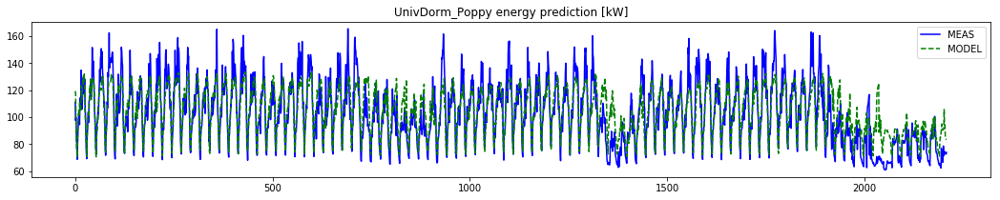

-------------------------
Modelling: UnivDorm_Antonio
Weatherfile: weather0.csv
alpha: 0.979
MAPE: 6.61
NMBE: 2.7
CVRSME: 8.57
R SQUARED: 0.61


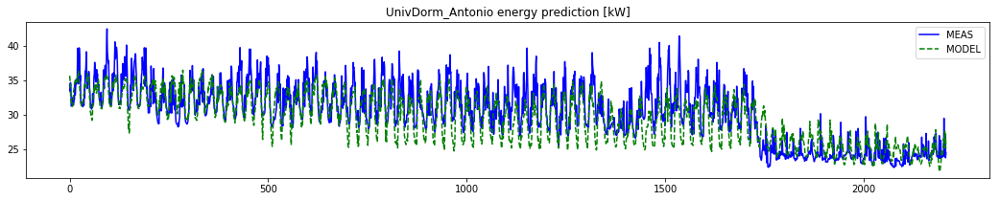

-------------------------
Modelling: UnivDorm_Malcolm
Weatherfile: weather3.csv
alpha: 0.013
MAPE: 6.05
NMBE: -1.2
CVRSME: 7.66
R SQUARED: 0.84


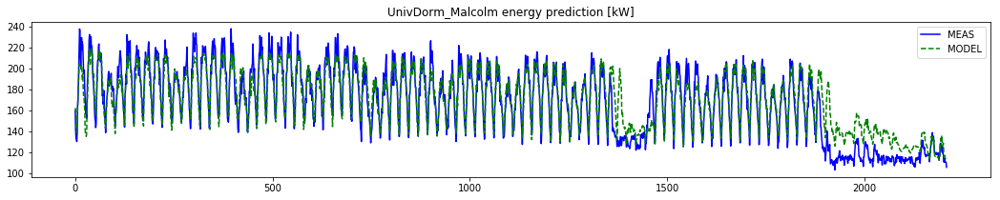

-------------------------
Modelling: UnivDorm_Ciaran
Weatherfile: weather2.csv
alpha: 0.01
MAPE: 12.21
NMBE: -3.82
CVRSME: 14.44
R SQUARED: 0.74


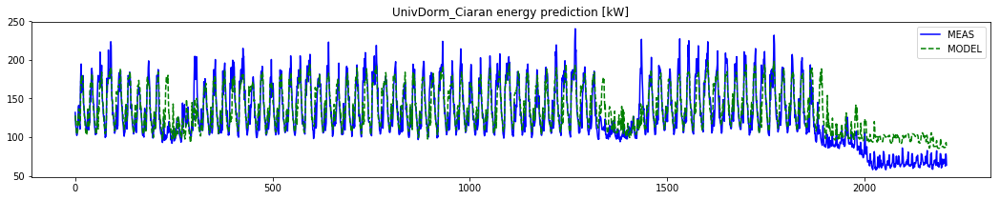

-------------------------
Modelling: UnivDorm_Alyssa
Weatherfile: weather0.csv
alpha: 0.064
MAPE: 7.08
NMBE: -3.8
CVRSME: 8.63
R SQUARED: 0.3


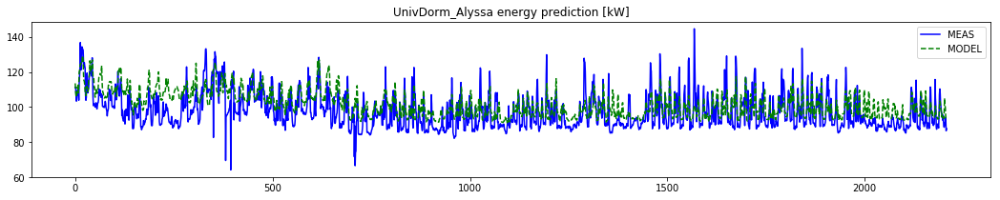

-------------------------
Modelling: UnivDorm_Phoebe
Weatherfile: weather4.csv
alpha: 0.011
MAPE: 6.22
NMBE: 0.96
CVRSME: 8.17
R SQUARED: 0.55


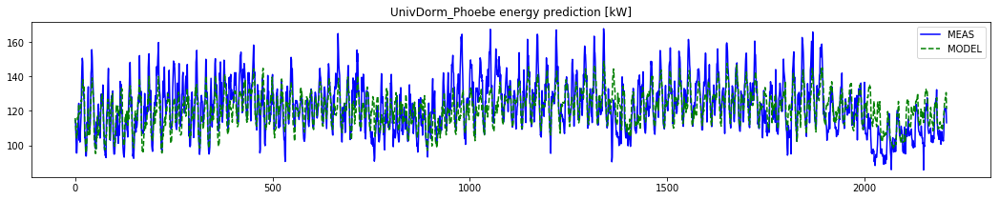

-------------------------
Modelling: UnivDorm_Marquis
Weatherfile: weather3.csv
alpha: 0.018
MAPE: 8.11
NMBE: 1.12
CVRSME: 10.31
R SQUARED: 0.77


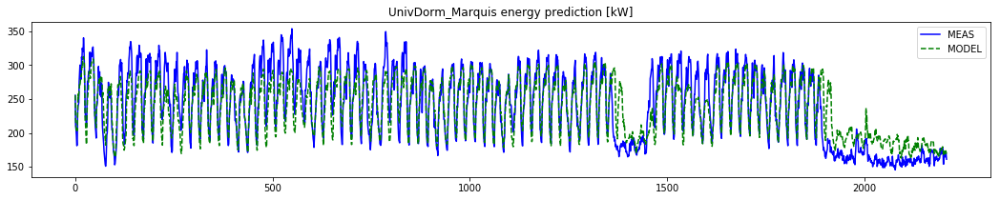

-------------------------
Modelling: UnivDorm_Avery
Weatherfile: weather0.csv
alpha: 0.605
MAPE: 8.22
NMBE: -1.59
CVRSME: 9.74
R SQUARED: 0.81


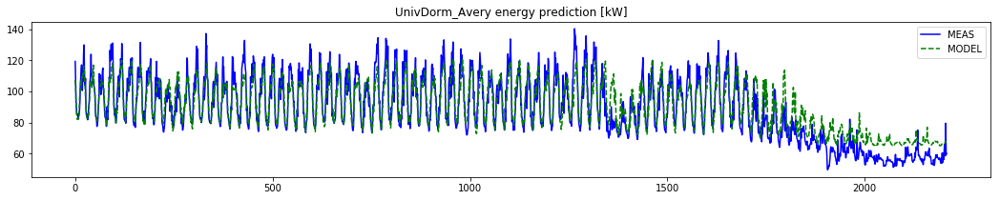

-------------------------
Modelling: UnivDorm_Mauricio
Weatherfile: weather3.csv
alpha: 0.02
MAPE: 7.09
NMBE: -1.17
CVRSME: 9.53
R SQUARED: 0.8


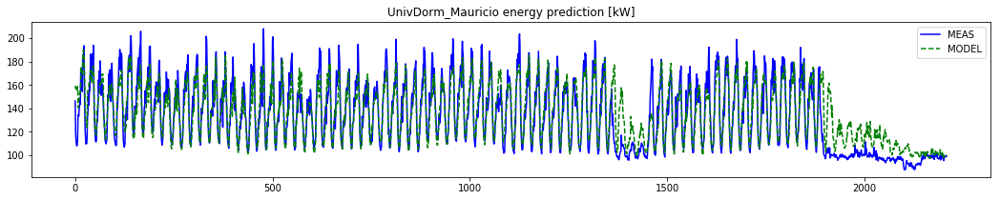

-------------------------
Modelling: UnivDorm_Petar
Weatherfile: weather4.csv
alpha: 0.704
MAPE: 7.45
NMBE: -1.33
CVRSME: 9.95
R SQUARED: 0.63


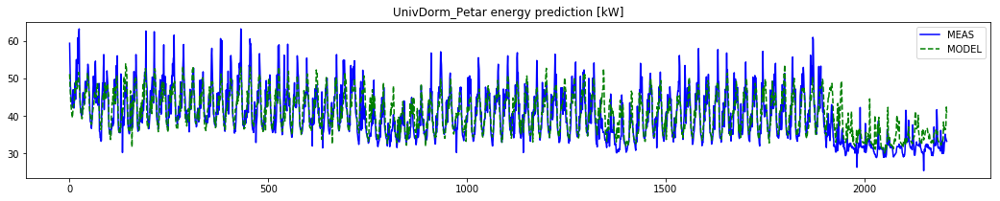

-------------------------


In [18]:
MAPE_data, NMBE_data, CVRSME_data, RSQUARED_data, alpha_data = get_model(buildingnames_dorm[0:50], meta, temporal)

In [19]:
metrics_dorm = pd.DataFrame([MAPE_data, NMBE_data, CVRSME_data, RSQUARED_data, alpha_data]).T
metrics_dorm.columns = ["MAPE", "NMBE", "CVRSME", "RSQUARED", "alpha"]
metrics_dorm

,MAPE,NMBE,CVRSME,RSQUARED,alpha
UnivDorm_Adan,13.798499,-3.307054,14.701691,0.839342,0.026567
UnivDorm_Ahmad,8.896653,4.337070,12.491802,0.685631,0.010385
UnivDorm_Alonzo,6.801160,1.682897,9.514723,0.553361,0.010385
UnivDorm_Alyssa,7.078247,-3.796908,8.630501,0.298424,0.064280
UnivDorm_Antonio,6.607715,2.695726,8.573377,0.614069,0.978655
UnivDorm_April,6.778774,-1.136171,8.574414,0.848246,0.010522
UnivDorm_Ashleigh,3.502899,0.208710,5.214520,0.739497,0.015265
UnivDorm_Avery,8.221098,-1.592301,9.736979,0.805124,0.605243
UnivDorm_Candace,8.753553,2.180216,12.343076,0.367766,0.241928
UnivDorm_Carla,10.622680,-1.925516,12.572696,0.476638,0.422064


array([[<matplotlib.axes._subplots.AxesSubplot object at 0x000001CF39F7A7B8>,
      dtype=object)

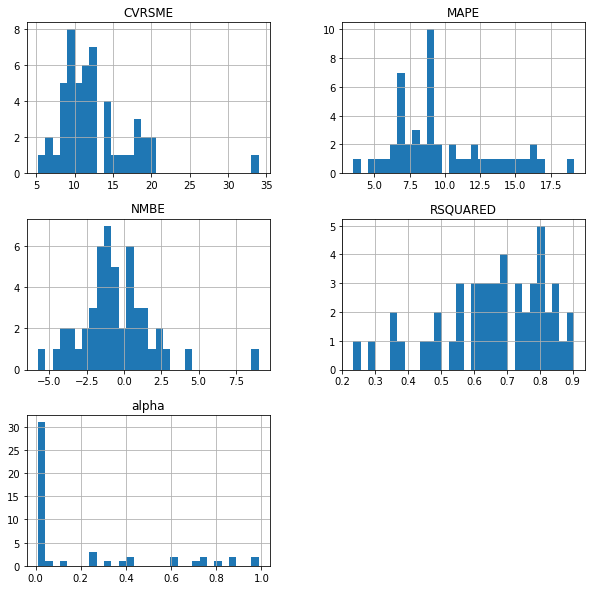

In [20]:
metrics_dorm[metrics_dorm<100].hist(bins=30, figsize=(10,10))